# Load libraries

In [ ]:
import os
import math
import pickle
import glob

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from scipy import signal
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter
from astropy.convolution import Gaussian2DKernel, convolve_fft
from scipy.interpolate import interp1d

import random
from dataclasses import dataclass
from typing import List, Tuple, Optional
import pandas as pd

from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

In [ ]:
from astropy.io          import fits
from astropy             import units as u
from astropy.coordinates import SkyCoord
from astropy.wcs         import WCS

In [ ]:
from pathlib import Path

# Paths

In [ ]:
home_path = Path('/home/100/vn9735/')
base_path = home_path / 'tpc'
checkpoint_path = base_path / 'checkpoints'
img_path = base_path / 'figs'
checkpoint_path

PosixPath('/home/100/vn9735/tpc/checkpoints')

In [ ]:
sc_path = Path('/scratch/xt61/vn9735/')

data_path     = sc_path / 'data'
npy_path      = data_path / 'npy'
checkpoint_path = data_path / 'checkpoints'
uma_data_path = data_path / 'UMA'

saury2014_data_path = data_path # 'saury'
saury_data_path = data_path # 'saury'
seta222_data_path = data_path   # 'seta'
print(checkpoint_path)
print('UMA: ', uma_data_path)
print('Saury 2014: ', saury2014_data_path)

/scratch/xt61/vn9735/data/checkpoints
UMA:  /scratch/xt61/vn9735/data/UMA
Saury 2014:  /scratch/xt61/vn9735/data


In [ ]:
cube_path = data_path / 'cube'

In [ ]:
hires_data_path = data_path / 'hires'
hires_results = hires_data_path / 'results'
abs_data_path = hires_data_path / 'abs'
em_data_path = hires_data_path / 'neighbour_emission_spectra_20241011'
print(data_path)
print(hires_data_path)
print(em_data_path)
print(abs_data_path)

/scratch/xt61/vn9735/data
/scratch/xt61/vn9735/data/hires
/scratch/xt61/vn9735/data/hires/neighbour_emission_spectra_20241011
/scratch/xt61/vn9735/data/hires/abs


# For plotting

In [ ]:
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

In [ ]:
# Circle
def _circle(x, y, r):
    theta = np.linspace(0, 2*np.pi, 100)
    return x + r*np.cos(theta), y + r*np.sin(theta)

gl_LMC = 279.
gb_LMC = -33.5
R_LMC = 5.

gl_SMC = 302.
gb_SMC = -44.5
R_SMC = 3.

LMC = dict(
    gl = gl_LMC,
    gb = gb_LMC,
    center = [gl_LMC, gb_LMC],
    glon_range = [270., 307.],
    glat_range = [-48., -25.],
    circ = _circle(gl_LMC, gb_LMC, R_LMC),
    name = 'Large Magellanic Cloud'
)


SMC = dict(
    gl = gl_SMC,
    gb = gb_SMC,
    center = [gl_SMC, gb_SMC],
    glon_range = [295., 315.],
    glat_range = [-50., -40.],
    circ = _circle(gl_SMC, gb_SMC, R_SMC),
    name = 'Small Magellanic Cloud'
)

# SMC_xcirc = _circle(305., -41, 3.),
# LMC_xcirc = _circle(277., -33.5, 6.)






# Approximate locations of LMC and SMC
SMC_xcirc, SMC_ycirc = SMC['circ']
LMC_xcirc, LMC_ycirc = LMC['circ']

# Circle
def hcircle(x, y, r):
    theta = np.linspace(1.365*np.pi, 1.55*np.pi, 100)
    return x + r*np.cos(theta), y + r*np.sin(theta)

# Circle
def vcircle(x, y, r):
    theta = np.linspace(1.73*np.pi, 1.87*np.pi, 100)
    return x + r*np.cos(theta), y + r*np.sin(theta)

gl_ch = 295.
gb_ch = 21.8
R_ch = 59.

gl_cv = 238.
gb_cv = -5.
R_cv = 57.


ch_xcirc, ch_ycirc = hcircle(gl_ch, gb_ch, R_ch)
cv_xcirc, cv_ycirc = vcircle(gl_cv, gb_cv, R_cv)

# glon = np.arange(270., 307., 0.1)
# glat = np.arange(-48., -25., 0.1)
lmc_glon = [270., 308.]
lmc_glat = [-48.99, -26.45]

# lmc_glon = [270., 309.]
# lmc_glat = [-48.25, -26.95]

gl_boundary = np.array([297., 302., 305., 308., 305., 297., 298., 295., 292., 294., 285., 283.5, 271.5, 271., 288.5, 290., 295., 297.])
gb_boundary = np.array([-36., -35., -40., -42.5, -48.5, -46.2, -43., -38.25, -39.8, -44.5, -45.9, -40.8, -41.5, -29., -26.9, -32., -31., -36.])

In [ ]:
## Plot Emission and absorption
def plot_gaskap_selected_em_abs(X,
                                Y,
                                x,
                                y,
                                xa,
                                ya,
                                sigya,
                                x0,
                                y0,
                                field,
                                src,
                                a,
                                b,
                                flux
                               ):
    ## Make a color bar
    colors = [(0, 0, 1), (0, 1, 0), (1, 0, 0)]  # R -> G -> B
    colors = ['blue', 'aqua', 'green', 'gold', 'r', 'maroon'] # colors = colors[::-1]
    n_bins = 500
    # cm   = mpl.colors.LinearSegmentedColormap.from_list('my_cbar', colors, N=n_bins)
    cm     = mpl.cm.get_cmap('cool') # winter, cool, hsv, Greens


    # Calc. angular distances to the central source
    diff_x = (X - x0)*np.cos(np.radians(y0))
    diff_y = Y - y0
    distances = np.sqrt(diff_x**2 + diff_y**2)*3600. # in arcsec
    dmin  = np.min(distances)
    dmax  = np.max(distances)

    ## Normalize colorbar onto Distance range
    dnorm = mpl.colors.Normalize(vmin=dmin, vmax=dmax)

    # Shape
    npix = len(X)



    # MW foreground range
    fg_idx = np.where(x < 50.)[0]
    x = x[fg_idx]
    y = y[fg_idx]

    fg_idx = np.where(xa < 50.)[0]
    xa = xa[fg_idx]
    ya = ya[fg_idx]
    sigya = sigya[fg_idx]


    # Plot
    fig, axes = plt.subplots(2, 1, figsize=(10,8), sharex=True)

    ax1 = axes[0]
    ## Emission (GASS)
    ## Plot nothing - invisible but just to create an object for colorbar
    sct = ax1.scatter([0], [0],
                      zorder=0,
                      s=0,
                      c=[0],
                      marker='o',
                      cmap=cm,
                      vmin=dmin,
                      vmax=dmax,
                      label=''
                     )
    # plt.plot(x, nearest, 'k:', zorder=1, label='')

    for spec_i in range(npix):
        color  = cm(dnorm(distances[spec_i]))
        label_i = "Emission spectra" if spec_i == 0 else ""
        ax1.plot(x, y[:, spec_i], ls='-', zorder=0, color=color, label=label_i)

    title = f'{field}, '
    title += f'{src}, '
    title += f'{round(flux, 1)} mJy, '
    title += f'({round(a*2, 1)}x{round(b*2, 1)}")' # , npix={npix}
    ax1.set_title('', fontsize=14)
    ax1.set_ylabel(r'$T_\mathrm{B}$ [K]', fontsize=20)
    # ax1.set_xlabel('VLSR (km/s)', fontsize=10)
    ax1.tick_params(axis='x', labelsize=16)
    ax1.tick_params(axis='y', labelsize=16)
    ax1.tick_params(axis='y', labelsize=16)
    ax1.tick_params(axis='y', direction='out',
                    length=6,
                    width=2,
                    colors='k',
                    grid_color='k',
                    grid_alpha=0.5)
    ax1.tick_params(axis='x', direction='in',
                    length=6,
                    width=2,
                    colors='k',
                    grid_color='k',
                    grid_alpha=0.5)

    ax1.set_xlim(-50., 50.)
    ax1.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)
    ax1.legend(loc='upper right', fancybox=False, framealpha=0.0, labelcolor='k', fontsize=16)


    ## Absorption
    ax2 = axes[1]
    ax2.plot(xa, ya, 'k-', lw=1.5, label='GASKAP absorption')
    ax2.plot(xa, 1.+sigya, 'k--', label=r'$1{\sigma}$')
    ax2.plot(xa, 1.-sigya, 'k--', label=r'')
    ax2.plot(xa, 1.-3.*sigya, 'k-.', label=r'$3{\sigma}$')
    # ax2.plot(xa, np.mean(ya)*np.ones(len(xa)), ls=':', color="k", label=r'mean')
    # ax2.fill_between(x, y, y, color='grey', alpha=0.3, facecolor='grey', label=r'')
    ax2.fill_between(xa,
                     1.-sigya, 1.+sigya,
                     color='grey',
                     alpha=0.3,
                     facecolor='grey',
                     label=r'')

    # ax2.plot(xa[peak_idx], ya[peak_idx], 'b+', label="detection")
    # ax2.vlines(xa[peak_idx], *plt.ylim(), color="C2", lw=1, ls="dashed", label="find_peaks")

    ax2.set_ylabel(r'$e^{-\tau}$', fontsize=24)
    ax2.set_xlabel(r'VLSR [km s$^{-1}$]', fontsize=20)
    ax2.tick_params(axis='x', labelsize=18)
    ax2.tick_params(axis='y', labelsize=18)
    ax2.tick_params(direction='out',
                    length=6,
                    width=2,
                    colors='k',
                    grid_color='k',
                    grid_alpha=0.5)

    # v1 = vrange[0] if vrange else np.floor(vlsr.min())
    # v2 = vrange[1] if vrange else np.ceil(vlsr.max())
    ax2.set_xlim(-50, 50)


    ax2.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)
    ax2.legend(loc='lower right', fancybox=True, framealpha=0.9, labelcolor='k', fontsize=16)



    axins1 = inset_axes(ax1,
                        width="2%",  # width: 50% of parent_bbox width
                        height="75%",  # height: 5%
                        loc="upper left",
                       )
    axins1.xaxis.set_ticks_position("bottom")
    cbar = fig.colorbar(sct,
                        cax=axins1,
                        orientation='vertical',
                        fraction=0.01,
                        pad=0.01, aspect=95)
    cbar.ax.set_ylabel(r'Offset [$^{\prime\prime}$]', rotation=90, labelpad=5., fontsize=14)


    # set the spacing between subplots
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                        wspace=None, hspace=0.00)

    # Filename to save
    # plt.savefig(img_file, bbox_inches='tight', pad_inches=0.09, format='jpg', dpi=150)

    plt.show()
    plt.close(fig)

In [ ]:
# Define the Gaussian function
def gaussian(v, tb, vlsr, sigma):
    return tb * np.exp(-(v - vlsr)**2 / (2 * sigma**2))

# Read GASKAP data cube

In [ ]:
gaskap_pilot_cube = cube_path / 'Tb_combined_mw_fg_full.fits'
# gaskap_pilot_cube = cube_path / 'Tb_combined_mw_fg_1km_30arcsec_central_region.fits'
# gaskap_pilot_cube = cube_path / 'Tb_combined_mw_fg_1km_30arcsec_central_region2.fits'
gaskap_pilot_cube = cube_path / 'Tb_combined_mw_fg_1km_30arcsec_central_region3.fits'

cube, hdr = fits.getdata(gaskap_pilot_cube, header=True)
cube.shape

(118, 1244, 2310)

In [ ]:
# xcube = SpectralCube.read(gaskap_pilot_cube)
# xcube

In [ ]:
cube = cube.astype(np.float32)

In [ ]:
tbpeak_map = np.nanmax(cube, axis=0)
tbpeak_map.shape

(1244, 2310)

In [ ]:
cube[cube < -3.] = 0.

In [ ]:
# Define parameters
pixel_scale = 6.0  # Replace with your actual arcsec/pixel
theta_kernel_arcsec = np.sqrt(60.**2 - 30.**2) # 30'' to 60''
sigma_pixels = theta_kernel_arcsec / (2.355 * pixel_scale)

# sigma is applied to (nchan, ny, nx)
# We use 0 for nchan because we only want to smooth spatially
sigma_spat = sigma_pixels
smoothed_cube = gaussian_filter(cube, sigma=(0., sigma_spat, sigma_spat))

In [ ]:
nchan, ny, nx = cube.shape
print('nchans, ny, nx:', nchan, ny, nx)

nchans, ny, nx: 118 1244 2310


In [ ]:
crval = hdr['CRVAL3']/1000.
print('crval: ', crval)

cdelt = hdr['CDELT3']/1000.
print('cdelt: ', cdelt)

crpix = hdr['CRPIX3']
print('crpix: ', crpix)

crval:  -65.695289265094
cdelt:  1.0
crpix:  1.0


In [ ]:
vchans = np.arange(1, nchan + 1)
vaxis = crval + (vchans - crpix) * cdelt

vaxis

array([-65.69528927, -64.69528927, -63.69528927, -62.69528927,
       -61.69528927, -60.69528927, -59.69528927, -58.69528927,
       -57.69528927, -56.69528927, -55.69528927, -54.69528927,
       -53.69528927, -52.69528927, -51.69528927, -50.69528927,
       -49.69528927, -48.69528927, -47.69528927, -46.69528927,
       -45.69528927, -44.69528927, -43.69528927, -42.69528927,
       -41.69528927, -40.69528927, -39.69528927, -38.69528927,
       -37.69528927, -36.69528927, -35.69528927, -34.69528927,
       -33.69528927, -32.69528927, -31.69528927, -30.69528927,
       -29.69528927, -28.69528927, -27.69528927, -26.69528927,
       -25.69528927, -24.69528927, -23.69528927, -22.69528927,
       -21.69528927, -20.69528927, -19.69528927, -18.69528927,
       -17.69528927, -16.69528927, -15.69528927, -14.69528927,
       -13.69528927, -12.69528927, -11.69528927, -10.69528927,
        -9.69528927,  -8.69528927,  -7.69528927,  -6.69528927,
        -5.69528927,  -4.69528927,  -3.69528927,  -2.69

In [ ]:
# 1. Create the mapping indices
# We map the 256 new slots across the 118 old slots
print(nchan)
old_indices = np.arange(nchan)
new_indices = np.linspace(0, nchan-1, 256)

# 2. Interpolate both Spectrum AND Velocity
# new_spectrum = np.interp(new_indices, old_indices, tb_tot_gfit)
v = np.interp(new_indices, old_indices, vaxis)

118


In [ ]:
# Create the interpolation function along the velocity axis (axis=0)
f = interp1d(old_indices, smoothed_cube, kind='cubic', axis=0)
resampled_cube = f(new_indices)

In [ ]:
gaskap_nspecs = ny * nx
gaskap_nspecs

2873640

In [ ]:
dv = hdr['CDELT3'] / 1000.
dv

1.0

In [ ]:
wcs3D = WCS(hdr)
print(wcs3D)

WCS Keywords

Number of WCS axes: 3
CTYPE : 'RA---TAN' 'DEC--TAN' 'VOPT'
CUNIT : 'deg' 'deg' 'm / s'
CRVAL : 56.755694111202 -72.799170553189 -65695.289265094
CRPIX : 1500.0 751.0 1.0
PC1_1 PC1_2 PC1_3  : 1.0 0.0 0.0
PC2_1 PC2_2 PC2_3  : 0.0 1.0 0.0
PC3_1 PC3_2 PC3_3  : 0.0 0.0 1.0
CDELT : -0.00666666 0.00666666 1000.0
NAXIS : 2310  1244  118


In [ ]:
wcs2D = wcs3D.celestial
wcs2D

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN'
CUNIT : 'deg' 'deg'
CRVAL : 56.755694111202 -72.799170553189
CRPIX : 1500.0 751.0
PC1_1 PC1_2  : 1.0 0.0
PC2_1 PC2_2  : 0.0 1.0
CDELT : -0.00666666 0.00666666
NAXIS : 2310  1244

In [ ]:
m0_map = np.sum(cube, axis=0)*dv

In [ ]:
nhi = 0.018224*m0_map

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


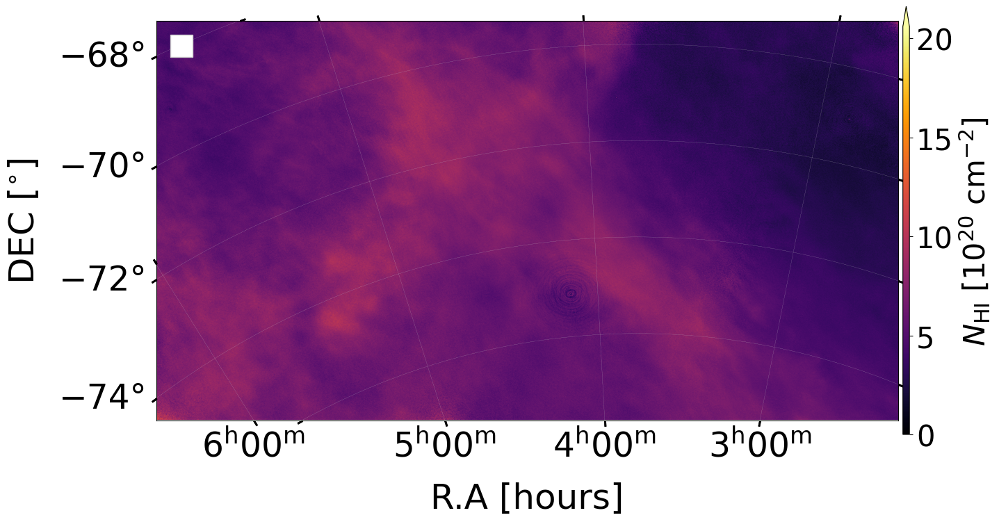

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'


fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D)

# Display the moment map image
im = ax.imshow(nhi, cmap='inferno', vmin=0.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=65)
cbar.ax.set_ylabel(r'$N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=31)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

# ax.set_xlim(0, 5000)
# ax.set_ylim(0, 3500)

ax.legend(loc='upper left', fancybox=False, framealpha=1., labelcolor='k', facecolor='w', handletextpad=-0.25, fontsize=29)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

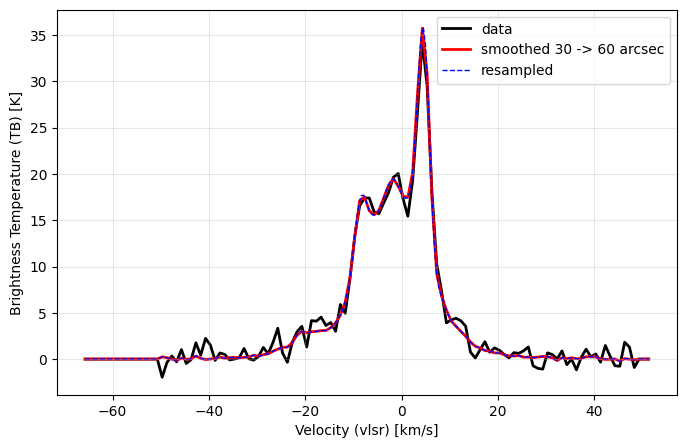

In [ ]:
i = 150
j = 150

plt.figure(figsize=(8, 5))

plt.plot(vaxis, cube[:, j, i], color='black', linewidth=2, zorder=-1, label='data')
plt.plot(vaxis, smoothed_cube[:, j, i], color='r', linewidth=2, zorder=-1, label='smoothed 30 -> 60 arcsec')
plt.plot(v, resampled_cube[:, j, i], color='b', ls='--', linewidth=1, zorder=-1, label='resampled')

# plt.title(f'Line of Sight: {los_id}')
plt.xlabel('Velocity (vlsr) [km/s]')
plt.ylabel('Brightness Temperature (TB) [K]')
plt.legend()
plt.grid(True, alpha=0.3)

# To avoid opening hundreds of windows, either show a few or save them:
plt.show()

In [ ]:
nchan, ny, nx = resampled_cube.shape
print(nchan, ny, nx)

256 1244 2310


In [ ]:
cube_rs_all = resampled_cube.reshape(nchan, ny * nx).T
print(cube_rs_all.shape)

(2873640, 256)


# Physics-constrained autoencoder

In [ ]:
class PhysicsLayer(nn.Module):
    """
    HI 21cm radiative transfer physics layer.
    TB = T_HI * (1 - exp(-tau))
    """
    def __init__(self):
        super(PhysicsLayer, self).__init__()

    def forward(self, log10_T_HI, tau):
        """
        Args:
            log10_T_HI: log10 of HI spin temperature (batch, 256)
            tau: optical depth (batch, 256)
        Returns:
            TB: brightness temperature (batch, 256)
        """
        T_HI = 10. ** log10_T_HI
        TB = T_HI * (1. - torch.exp(-tau))
        return TB

In [ ]:
class Encoder(nn.Module):
    """
    Encoder: emission spectrum -> latent distribution parameters
    Using Conv1D for better spectral feature extraction
    """
    def __init__(self, input_dim=256, latent_dim=64):
        super(Encoder, self).__init__()

        # Convolutional layers for spectral features
        self.conv_layers = nn.Sequential(
            nn.Conv1d(1, 32, kernel_size=5, padding=2),
            nn.BatchNorm1d(32),
            nn.LeakyReLU(0.2),
            nn.MaxPool1d(2),  # 256 -> 128

            nn.Conv1d(32, 64, kernel_size=5, padding=2),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2),
            nn.MaxPool1d(2),  # 128 -> 64

            nn.Conv1d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2),
            nn.MaxPool1d(2),  # 64 -> 32

            nn.Conv1d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2),
        )

        # Fully connected layers
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 32, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2)
        )

        # Output: mean and log_variance for the latent distribution
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, x):
        # x shape: (batch, 256)
        x = x.unsqueeze(1)  # (batch, 1, 256) for Conv1d
        h = self.conv_layers(x)
        h = self.fc(h)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        # Clamp logvar to prevent numerical instability
        logvar = torch.clamp(logvar, -10, 10)
        return mu, logvar

In [ ]:
class Decoder(nn.Module):
    """
    Decoder: latent -> (log10_T_HI, tau)
    Using transposed convolutions for upsampling
    """
    def __init__(self, latent_dim=64, output_dim=256):
        super(Decoder, self).__init__()

        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 128 * 32),
            nn.BatchNorm1d(128 * 32),
            nn.LeakyReLU(0.2)
        )

        # Transposed conv for upsampling
        self.deconv_layers = nn.Sequential(
            nn.Unflatten(1, (128, 32)),  # (batch, 128, 32)

            nn.ConvTranspose1d(128, 128, kernel_size=4, stride=2, padding=1),  # 32 -> 64
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose1d(128, 64, kernel_size=4, stride=2, padding=1),  # 64 -> 128
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2),

            nn.ConvTranspose1d(64, 32, kernel_size=4, stride=2, padding=1),  # 128 -> 256
            nn.BatchNorm1d(32),
            nn.LeakyReLU(0.2),
        )

        # Separate heads for physical parameters
        self.conv_log10_T_HI = nn.Conv1d(32, 1, kernel_size=3, padding=1)
        self.conv_tau = nn.Conv1d(32, 1, kernel_size=3, padding=1)

    def forward(self, z):
        h = self.fc(z)
        h = self.deconv_layers(h)

        # log10_T_HI typically in range [1, 4] (10K to 10000K)
        log10_T_HI = self.conv_log10_T_HI(h).squeeze(1)  # (batch, 256)
        log10_T_HI = torch.sigmoid(log10_T_HI) * 3 + 1.  # range: [1, 4]
        # log10_T_HI = torch.clamp(log10_T_HI, 0.45, 4.122)

        # tau typically in range [0, 10]
        tau = self.conv_tau(h).squeeze(1)  # (batch, 256)
        tau = F.softplus(tau)

        return log10_T_HI, tau

In [ ]:
class HI_VAE(nn.Module):
    """
    Variational Autoencoder for HI radiative transfer with physics layer
    """
    def __init__(self, spectrum_dim=256, latent_dim=64):
        super(HI_VAE, self).__init__()

        self.encoder = Encoder(spectrum_dim, latent_dim)
        self.decoder = Decoder(latent_dim, spectrum_dim)
        self.physics_layer = PhysicsLayer()
        self.latent_dim = latent_dim

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick: z = mu + sigma * epsilon
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, TB_obs):
        """
        Forward pass through VAE
        """
        # Encode
        mu, logvar = self.encoder(TB_obs)

        # Sample from latent distribution
        z = self.reparameterize(mu, logvar)

        # Decode to physical parameters
        log10_T_HI, tau = self.decoder(z)

        # Apply physics layer
        TB_recon = self.physics_layer(log10_T_HI, tau)

        return TB_recon, log10_T_HI, tau, mu, logvar

    def sample_posterior(self, TB_obs, n_samples=512):
        """
        Sample from posterior distribution p(T_HI, tau | TB_obs)
        """
        self.eval()
        with torch.no_grad():
            mu, logvar = self.encoder(TB_obs)

            T_HI_samples = []
            tau_samples = []
            TB_samples = []

            for _ in range(n_samples):
                z = self.reparameterize(mu, logvar)
                log10_T_HI, tau = self.decoder(z)
                TB_recon = self.physics_layer(log10_T_HI, tau)

                T_HI_samples.append(10. ** log10_T_HI)
                tau_samples.append(tau)
                TB_samples.append(TB_recon)

            return (torch.stack(T_HI_samples),
                    torch.stack(tau_samples),
                    torch.stack(TB_samples))

In [ ]:
def vae_loss(TB_recon, TB_obs, log10_T_HI, tau, mu, logvar, beta=1., lambda_tspin_prior=10., smoothness_weight=1.):
    """
    VAE loss = reconstruction loss + KL divergence

    Args:
        TB_recon: reconstructed brightness temperature
        TB_obs: observed brightness temperature
        mu: latent mean
        logvar: latent log variance
        beta: weight for KL divergence (beta-VAE)
    """
    beta = 1.
    lambda_tspin_prior = 1.
    # Reconstruction loss (MSE)
    # recon_loss = F.mse_loss(TB_recon, TB_obs, reduction='sum') / TB_obs.size(0)

    # Main reconstruction loss (MSE)
    recon_loss = nn.MSELoss()(TB_recon, TB_obs)

    # KL divergence
    kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())


    # Smoothness loss - penalize large differences between adjacent channels
    # This encourages smooth spectra and reduces "comb" artifacts
    diff = TB_recon[:, 1:] - TB_recon[:, :-1]
    smoothness_loss = torch.mean(diff ** 2)

    # Second derivative (curvature) penalty for even smoother results
    second_diff = TB_recon[:, 2:] - 2 * TB_recon[:, 1:-1] + TB_recon[:, :-2]
    curvature_loss = torch.mean(second_diff ** 2)

    # Combined smoothness term
    smooth_term = smoothness_loss + 0.5 * curvature_loss



    # Compute expected T_spin from predicted tau
    # Add small epsilon to avoid division by zero
    # ts_expected_sims = 30. * ((1. - np.exp(-tau_peak_vals))**(-0.68) )
    epsilon = 1.e-6
    factor = (1. - torch.exp(-tau)) # + epsilon
    T_spin_expected = 30. * torch.pow(factor, -0.68)
    log10_T_spin_expected = torch.log10(T_spin_expected + epsilon)

    tspin_prior_loss = torch.mean((log10_T_HI - log10_T_spin_expected)**2)

    total_loss = recon_loss + beta*kl_loss + lambda_tspin_prior*tspin_prior_loss + smoothness_weight * smooth_term
    return total_loss, recon_loss, kl_loss, tspin_prior_loss, smooth_term

In [ ]:
# # Dataset class
# class HISpectrumDataset(Dataset):
#     def __init__(self, emission_spectra):
#         """
#         Args:
#             emission_spectra: numpy array of shape (n_samples, 256)
#         """
#         self.emission = torch.FloatTensor(emission_spectra)

#     def __len__(self):
#         return len(self.emission)

#     def __getitem__(self, idx):
#         return self.emission[idx]


# Dataset class
class HISpectrumDataset(Dataset):
    def __init__(self, emission_spectra, normalize=False):
        """
        Args:
            emission_spectra: numpy array of shape (n_samples, 256)
            normalize: whether to normalize the data
        """
        self.emission = torch.FloatTensor(emission_spectra)
        self.normalize = normalize

        if normalize:
            self.mean = self.emission.mean(dim=0, keepdim=True)
            self.std = self.emission.std(dim=0, keepdim=True) + 1e-8
            self.emission = (self.emission - self.mean) / self.std

    def __len__(self):
        return len(self.emission)

    def __getitem__(self, idx):
        return self.emission[idx]

    def denormalize(self, x):
        if self.normalize:
            return x * self.std + self.mean
        return x

# Training

In [ ]:
# Training function
def train_vae(model, dataloader, optimizer, device, epoch, n_epochs, beta_schedule='constant', beta_max=1.):
    model.train()
    total_loss = 0.
    total_recon = 0.
    total_kl = 0.
    total_ts_prior = 0.
    total_smooth = 0.

    # Beta annealing
    if beta_schedule == 'linear':
        beta = min(beta_max, beta_max * epoch / (n_epochs * 0.5))
    elif beta_schedule == 'cyclical':
        cycle = epoch % (n_epochs // 4)
        beta = min(beta_max, beta_max * cycle / (n_epochs // 8))
    else:  # constant
        beta = beta_max

    for batch in dataloader:
        TB_obs = batch.to(device)

        # Forward pass
        TB_recon, log10_T_HI, tau, mu, logvar = model(TB_obs)

        # Compute loss
        loss, recon_loss, kl_loss, ts_prior_loss, smooth_loss = vae_loss(TB_recon, TB_obs, log10_T_HI, tau, mu, logvar, beta=beta)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()

        # Gradient clipping to prevent exploding gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        total_loss += loss.item()
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()
        total_ts_prior += ts_prior_loss.item()
        total_smooth += smooth_loss.item()
    # End - for: batch

    n_batches = len(dataloader)
    return total_loss/n_batches, total_recon/n_batches, total_kl/n_batches, total_ts_prior/n_batches, total_smooth/n_batches, beta

In [ ]:
def validate(model, dataloader, device, beta=1.):
    """Validation function"""
    model.eval()

    total_loss = 0.
    total_recon = 0.
    total_kl = 0.
    total_ts_prior = 0.
    total_smooth = 0.

    with torch.no_grad():
        for batch in dataloader:
            TB_obs = batch.to(device)
            TB_recon, log10_T_HI, tau, mu, logvar = model(TB_obs)

            # Compute loss
            # loss, recon_loss, kl_loss = vae_loss(TB_recon, TB_obs, mu, logvar, beta)
            loss, recon_loss, kl_loss, ts_prior_loss, smooth_loss = vae_loss(TB_recon, TB_obs, log10_T_HI, tau, mu, logvar, beta=beta)

            total_loss += loss.item()
            total_recon += recon_loss.item()
            total_kl += kl_loss.item()
            total_ts_prior += ts_prior_loss.item()
            total_smooth += smooth_loss.item()
        # End - for: batch
    # End - with

    n_batches = len(dataloader)
    return total_loss/n_batches, total_recon/n_batches, total_kl/n_batches, total_ts_prior/n_batches, total_smooth / n_batches

In [ ]:
def train_model(model, train_loader, val_loader, lr=0.001, device='cuda', num_epochs=100, beta_schedule='constant', beta_max=1.):
    """
    Training loop for the physics-constrained autoencoder.
    """
    model = model.to(device)

    # Use Adam with weight decay
    # optimizer = optim.Adam(model.parameters(), lr=lr)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                                                      factor=0.5, patience=5)

    history = {
        'total_loss': [],
        'recon_loss': [],
        'kl_loss': [],
        'ts_prior_loss': [],
        'smooth_loss': [],

        'val_total_loss': [],
        'val_recon_loss': [],
        'val_kl_loss': [],
        'val_ts_prior_loss': [],
        'val_smooth_loss': [],
    }

    # Training loop
    print("Training VAE...")
    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        epoch_losses = {'total': 0., 'recon': 0., 'smooth': 0., 'sparse': 0., 'kl':0., 'ts_prior': 0.,
                       'val_total': 0., 'val_recon': 0., 'val_smooth': 0., 'val_sparse': 0., 'val_kl':0., 'val_ts_prior': 0.}

        loss, recon, kl, ts_loss, smooth, beta = train_vae(model, train_loader, optimizer, device, epoch, num_epochs,
                                                   beta_schedule=beta_schedule, beta_max=beta_max)
        val_loss, val_recon, val_kl, val_ts, val_smooth = validate(model, val_loader, device, beta=beta)

        # Track losses
        epoch_losses['total'] = loss
        epoch_losses['recon'] = recon
        epoch_losses['kl'] = kl
        epoch_losses['ts_prior'] = ts_loss
        epoch_losses['smooth'] = smooth

        epoch_losses['val_total'] = val_loss
        epoch_losses['val_recon'] = val_recon
        epoch_losses['val_kl'] = val_kl
        epoch_losses['val_ts_prior'] = val_ts
        epoch_losses['val_smooth'] = val_smooth

        history['total_loss'].append(epoch_losses['total'])
        history['recon_loss'].append(epoch_losses['recon'])
        history['kl_loss'].append(epoch_losses['kl'])
        history['ts_prior_loss'].append(epoch_losses['ts_prior'])
        history['smooth_loss'].append(epoch_losses['smooth'])

        history['val_total_loss'].append(epoch_losses['val_total'])
        history['val_recon_loss'].append(epoch_losses['val_recon'])
        history['val_kl_loss'].append(epoch_losses['val_kl'])
        history['val_ts_prior_loss'].append(epoch_losses['val_ts_prior'])
        history['val_smooth_loss'].append(epoch_losses['val_smooth'])

        # Learning rate scheduling
        # scheduler.step(epoch_losses['total']) # recon, LATER, check with "total" loss
        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            print('Saving best model...')
            best_val_loss = val_loss
            torch.save(model.state_dict(), 'best_vae_model_a00_smooth_mw_mod_all1.pt')

        # Print progress
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}]")
            print(f"  Train: Total: {epoch_losses['total']:.4f}, Recon: {epoch_losses['recon']:.4f}")
            print(f"         KL: {epoch_losses['kl']:.4f}")
            print(f"         Ts prior: {epoch_losses['ts_prior']:.4f}")
            print(f"         smooth: {epoch_losses['smooth']:.4f}")

            print(f"  Val: Total: {epoch_losses['val_total']:.4f}, Recon: {epoch_losses['val_recon']:.4f}")
            print(f"         KL: {epoch_losses['val_kl']:.4f}")
            print(f"         Ts prior: {epoch_losses['val_ts_prior']:.4f}")
            print(f"         Smooth: {epoch_losses['val_smooth']:.4f}")

            print(f"  Beta: {beta:.4f}")

    return history

In [ ]:
# GPU or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ngpus = torch.cuda.device_count()
print('device: ', device)
print('device_count: ', ngpus)

device:  cuda
device_count:  1


In [ ]:
# velocities.shape
nchan

256

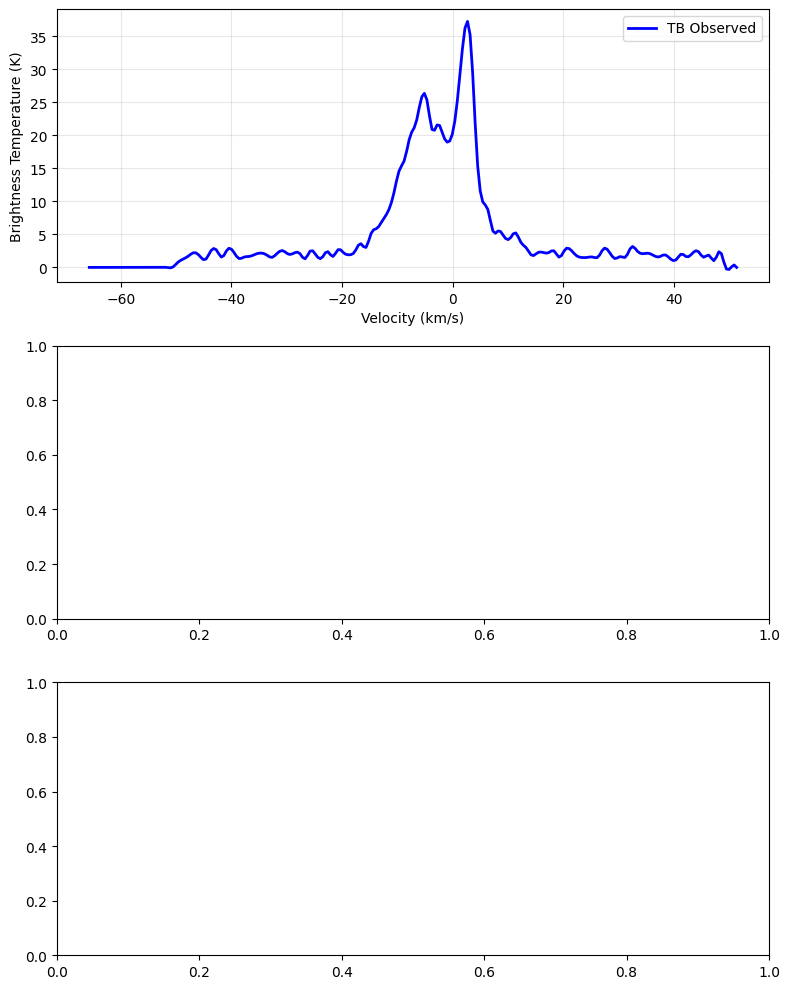

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(8,10))

idx = 10

axes[0].plot(v, cube_rs_all[idx], 'b-', label='TB Observed', linewidth=2)
axes[0].set_xlabel('Velocity (km/s)')
axes[0].set_ylabel('Brightness Temperature (K)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
cube_rs_all.shape

(2873640, 256)

In [ ]:
n_samples, n_channels = cube_rs_all.shape
print(f"Number of spectra: {n_samples}")
print(f"Number of channels: {n_channels}")

Number of spectra: 2873640
Number of channels: 256


In [ ]:
print(f"Training set: {n_samples} spectra with {n_channels} channels")
print(f"TB range: [{cube_rs_all.min():.2f}, {cube_rs_all.max():.2f}] K")


Training set: 2873640 spectra with 256 channels
TB range: [-1.46, 54.54] K


In [ ]:
# total 2873640 spectra
n_train = 2010148
n_val = 861492
n_test = 2000

# Generate all possible indices
all_indices = np.arange(n_samples)

# Shuffle the indices
np.random.shuffle(all_indices)

# Split into two different sets of indices
train_indices = all_indices[:n_train]
val_indices = all_indices[n_train:(n_train + n_val)]
test_indices = all_indices[(n_train + n_val):(n_train + n_val + n_test)]


train_spectra = cube_rs_all[train_indices, :]
val_spectra = cube_rs_all[val_indices, :]
test_spectra = cube_rs_all[test_indices, :]
print(train_spectra.shape)
print(val_spectra.shape)
print(test_spectra.shape)

(2010148, 256)
(861492, 256)
(2000, 256)


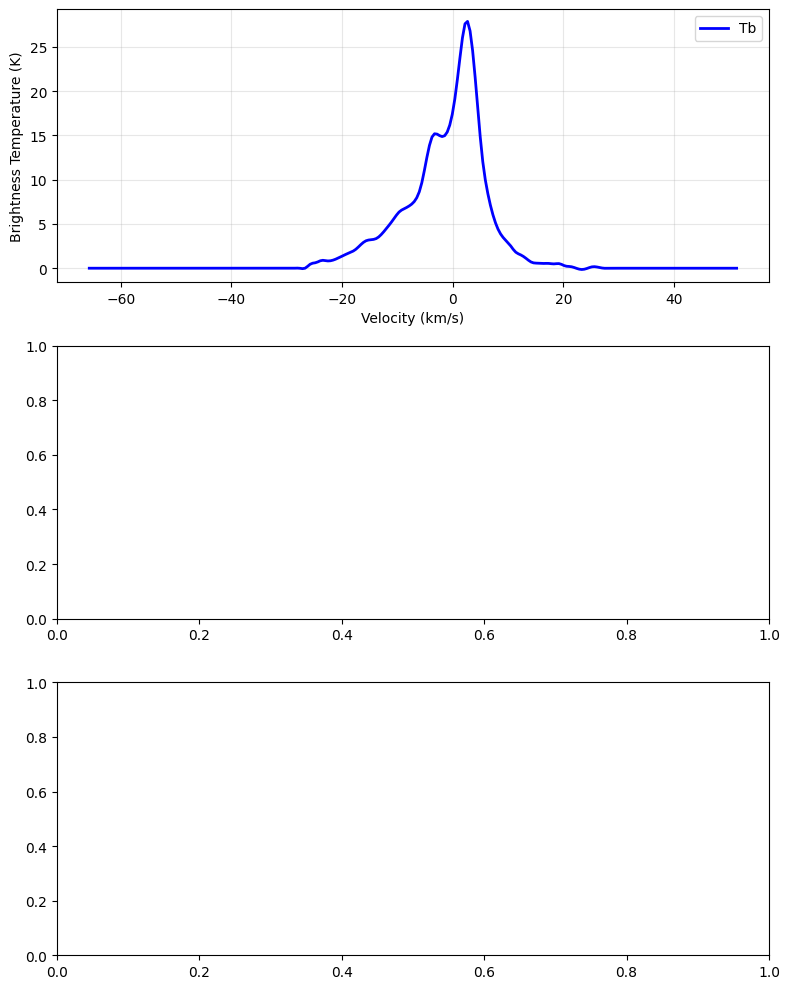

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))

idx = 1

axes[0].plot(v, test_spectra[idx], 'b-', label='Tb', linewidth=2)
axes[0].set_xlabel('Velocity (km/s)')
axes[0].set_ylabel('Brightness Temperature (K)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# axes[1].plot(v, test_tauspectra[idx], 'g-', linewidth=2)
# axes[1].axhline(y=0, color='k', linestyle='--', alpha=0.5)
# axes[1].set_xlabel('Velocity (km/s)')
# axes[1].set_ylabel('Optical Depth')
# axes[1].grid(True, alpha=0.3)

# axes[2].plot(v, test_tempspectra[idx], 'b-', label='True temperature', linewidth=2, alpha=0.7)
# axes[2].set_xlabel('Velocity (km/s)')
# axes[2].set_ylabel('Temperature [K]')
# axes[2].legend()
# axes[2].grid(True, alpha=0.3)

plt.tight_layout()
# plt.savefig('.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Hyperparameters
spectrum_dim = 256
latent_dim = 64  # 128 If reconstruction is still poor, reduce latent dimension further (try 16 or 8)
batch_size = 64

In [ ]:
learning_rate = 1.e-4
num_epochs = 40
beta_max = 0.5 # 0.5  # Start with lower beta, Lower beta_max to prioritise reconstruction
beta_schedule = 'constant'  # Use beta annealing

In [ ]:
# Create dataset and dataloader
dataset = HISpectrumDataset(train_spectra, normalize=False)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

val_dataset = HISpectrumDataset(val_spectra, normalize=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Initialize model
model = HI_VAE(spectrum_dim=spectrum_dim, latent_dim=latent_dim) #.to(device)

print(f"Model Architecture:")
print(model)
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")

Model Architecture:
HI_VAE(
  (encoder): Encoder(
    (conv_layers): Sequential(
      (0): Conv1d(1, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.2)
      (7): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
      (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2)
      (11): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (12): Conv1d(128, 128, kernel_size=(3,), st

# Run training

In [ ]:
# Train model
history = train_model(model, train_loader, val_loader, lr=learning_rate, device=device, num_epochs=num_epochs, beta_schedule=beta_schedule, beta_max=beta_max)

Training VAE...
Saving best model...
Saving best model...
Saving best model...
Saving best model...
Saving best model...
Saving best model...
Saving best model...
Saving best model...
Epoch [10/40]
  Train: Total: 0.7111, Recon: 0.1930
         KL: 0.1524
         Ts prior: 0.1356
         smooth: 0.2301
  Val: Total: 0.6803, Recon: 0.1753
         KL: 0.1501
         Ts prior: 0.1309
         Smooth: 0.2241
  Beta: 0.5000
Saving best model...
Saving best model...
Saving best model...
Epoch [20/40]
  Train: Total: 0.6992, Recon: 0.1837
         KL: 0.1500
         Ts prior: 0.1351
         smooth: 0.2305
  Val: Total: 0.6761, Recon: 0.1730
         KL: 0.1453
         Ts prior: 0.1340
         Smooth: 0.2239
  Beta: 0.5000
Saving best model...
Saving best model...
Saving best model...
Epoch [30/40]
  Train: Total: 0.6937, Recon: 0.1786
         KL: 0.1494
         Ts prior: 0.1349
         smooth: 0.2308
  Val: Total: 0.6681, Recon: 0.1631
         KL: 0.1479
         Ts prior: 0.1332


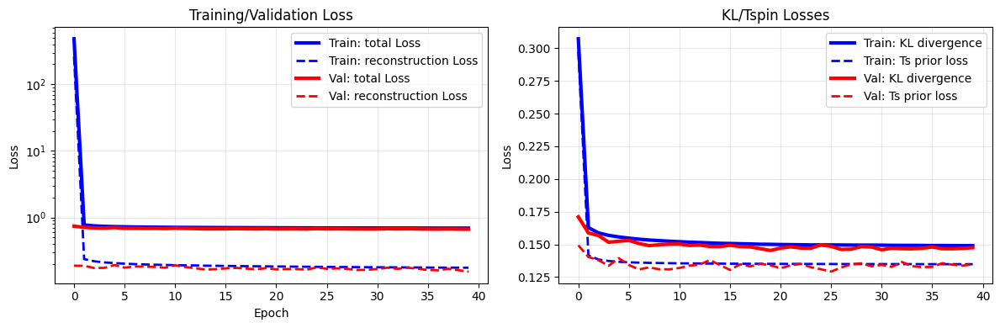

In [ ]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['total_loss'], 'b-', lw=3, label='Train: total Loss')
plt.plot(history['recon_loss'], 'b--', lw=2, label='Train: reconstruction Loss')

plt.plot(history['val_total_loss'], 'r-', lw=3, label='Val: total Loss')
plt.plot(history['val_recon_loss'], 'r--', lw=2, label='Val: reconstruction Loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training/Validation Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(history['kl_loss'], 'b-', lw=3, label='Train: KL divergence')
# plt.plot(history['sparse_loss'], label='Sparsity Loss')
plt.plot(history['ts_prior_loss'], 'b--', lw=2, label='Train: Ts prior loss')

plt.plot(history['val_kl_loss'], 'r-', lw=3,label='Val: KL divergence')
plt.plot(history['val_ts_prior_loss'], 'r--', lw=2, label='Val: Ts prior loss')

# plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('KL/Tspin Losses')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# Inference: application to observed GASKAP HI data

In [ ]:
if True:
    saved_model_path = checkpoint_path / f'best_vae_model_a00_smooth_mod{vaemodel}_mw_{test_start}_{test_end}.pt'
    saved_model_path = checkpoint_path / 'best_vae_model_a00_smooth_mw_mod_all1.pt'
    state_dict = torch.load(saved_model_path, map_location=torch.device(device))
    model.load_state_dict(state_dict)

    # model.eval()

    model.to(device)

    print("Model loaded successfully!")

Model loaded successfully!


In [ ]:
sel_idx = np.where(np.max(test_spectra, axis=1) > 20.)[0]
sel_idx

array([   0,    1,    2, ..., 1997, 1998, 1999])

In [ ]:
def visu(model, v, test_spectra, device, test_idx = 0):
    # Visualize results on a test spectrum
    print("Generating visualization...")
    print('test spectrum idx: ', test_idx)

    test_spectrum = test_spectra[test_idx]  # Use first spectrum as test



    """
    Visualize the decomposition results for a single spectrum.

    Args:
        model: Trained model
        test_spectrum: Observed TB spectrum
        T_true: True temperature spectrum (ground truth)
        tau_true: True optical depth spectrum (ground truth)
        velocities: Velocity array
        device: Computing device
    """
    model.eval()
    with torch.no_grad():
        TB_obs = torch.FloatTensor(test_spectrum).unsqueeze(0).to(device)
        # T_HI, tau, TB_recon = model(TB_obs)
        T_HI_samples, tau_samples, TB_samples = model.sample_posterior(TB_obs, n_samples=512)
        # print(tau_samples)

        # Get mean and std for uncertainty quantification
        T_HI, _ = T_HI_samples.median(dim=0)
        T_HI_std = T_HI_samples.std(dim=0)
        tau, _ = tau_samples.median(dim=0)
        # print(tau)
        tau_std = tau_samples.std(dim=0)

        TB_recon, _ = TB_samples.median(dim=0)
        TB_recon_std = TB_samples.std(dim=0)

        # Move to CPU for plotting
        TB_obs = TB_obs.cpu().numpy()[0]

        T_HI = T_HI.cpu().numpy()[0]
        T_HI_std = T_HI_std.cpu().numpy()[0]

        lower_bound_linear = T_HI - T_HI_std
        upper_bound_linear = T_HI + T_HI_std

        lower_bound_linear50 = T_HI - 50.
        upper_bound_linear50 = T_HI + 50.

        # Ensure bounds are positive before taking log10
        lower_bound_linear[lower_bound_linear <= 0] = 1e-6
        upper_bound_linear[upper_bound_linear <= 0] = 1e-6 # This should usually be fine if median and std are positive

        log10_lower_bound = np.log10(lower_bound_linear)
        log10_upper_bound = np.log10(upper_bound_linear)

        log10_lower_bound_linear50 = np.log10(lower_bound_linear50)
        log10_upper_bound_linear50 = np.log10(upper_bound_linear50)


        T_HI = np.log10(T_HI)
        T_HI_std = np.log10(T_HI_std)

        tau = tau.cpu().numpy()[0]
        tau_std = tau_std.cpu().numpy()[0]

        TB_recon = TB_recon.cpu().numpy()[0]
        TB_recon_std = TB_recon_std.cpu().numpy()[0]
    # End - with




    # Plots
    fig, axes = plt.subplots(2, 3, figsize=(22, 10))

    fontsize = 22
    lgsize = 18

    # Plot 1: Observed vs Reconstructed
    ax = axes[0, 0]
    ax.plot(v, TB_obs, 'b-', label=r'$T_\mathrm{B}$ Observed', linewidth=2)
    ax.plot(v, TB_recon, 'r--', label=r'$T_\mathrm{B}$ Reconstructed', linewidth=2)
    ax.fill_between(v, TB_recon-TB_recon_std, TB_recon+TB_recon_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, TB_recon-1., TB_recon+1., alpha=0.3, facecolor='cyan')
    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel(r'$T_\mathrm{B}$ (K)', fontsize=fontsize)
    # ax.set_title('Observed vs Reconstructed Spectrum', fontsize=13)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 2: Residuals
    ax = axes[1, 0]
    residual = TB_obs - TB_recon
    ax.plot(v, residual, 'g-', linewidth=2, label=f'Residuals (RMS: {np.sqrt(np.mean(residual**2)):.2f} K)')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=-1., ymax=1., color='gray', alpha=0.3, label=r'1$\sigma$ ~1K')

    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('Residual (K)', fontsize=fontsize)
    # ax.set_title(f'Residuals (RMS: {np.sqrt(np.mean(residual**2)):.2f} K)')

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=fontsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 3: Predicted vs True Temperature
    ax = axes[0, 1]
    # ax.plot(v, test_tempspectrum, 'b-', label='True Ts', linewidth=2, alpha=0.7)
    ax.plot(v, T_HI, 'r--', label='Predicted Ts', linewidth=2)
    ax.fill_between(v, log10_lower_bound, log10_upper_bound, alpha=0.3, facecolor='grey')
    ax.fill_between(v, log10_lower_bound_linear50, log10_upper_bound_linear50, alpha=0.3, facecolor='cyan')
    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('(log10) Temperature (K)', fontsize=fontsize)
    # ax.set_title('Temperature: True vs Predicted')

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 4: Predicted vs True Optical Depth
    ax = axes[0, 2]
    # axes[0, 2].plot(v, test_tauspectrum, 'b-', label='True τ', linewidth=2, alpha=0.7)
    axes[0, 2].plot(v, tau, 'r--', label='Predicted τ', linewidth=2)
    ax.fill_between(v, tau-tau_std, tau+tau_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, tau-0.05, tau+0.05, alpha=0.3, facecolor='cyan')
    axes[0, 2].set_xlabel('Velocity (km/s)', fontsize=fontsize)
    axes[0, 2].set_ylabel('Optical Depth', fontsize=fontsize)
    # axes[0, 2].set_title('Optical Depth: True vs Predicted')

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 5: Temperature Error
    # T_error = T_HI - test_tempspectrum

    ax = axes[1, 1]
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    ax.fill_between(v, (log10_lower_bound_linear50-T_HI), (log10_upper_bound_linear50-T_HI), alpha=0.3, facecolor='cyan')

    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('(log10) Temperature Error (K)', fontsize=fontsize)
    # ax.set_title(f'Ts Error (RMS: {np.sqrt(np.mean(T_error**2)):.2f} K)')

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(loc='upper left', fancybox=True, framealpha=0.5, labelcolor='k', fontsize=fontsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)




    # Plot 6: Optical Depth Error
    # tau_error = tau - test_tauspectrum

    ax = axes[1, 2]
    # ax.plot(v, tau_error, 'orange', linewidth=2, label=f'τ Error (RMS: {np.sqrt(np.mean(tau_error**2)):.2f})')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=-0.05, ymax=0.05, color='gray', alpha=0.3, label=r'1$\sigma \sim 0.05$')


    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('Optical Depth Error', fontsize=fontsize)
    # ax.set_title(f'τ Error (RMS: {np.sqrt(np.mean(tau_error**2)):.2f})')

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=fontsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.1,
                    hspace=0.0
                    )

    plt.tight_layout()
    # plt.savefig('hi_decomposition_results.png', dpi=300, bbox_inches='tight')
    plt.show()

# Cases of low TB

Generating visualization...
test spectrum idx:  55


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


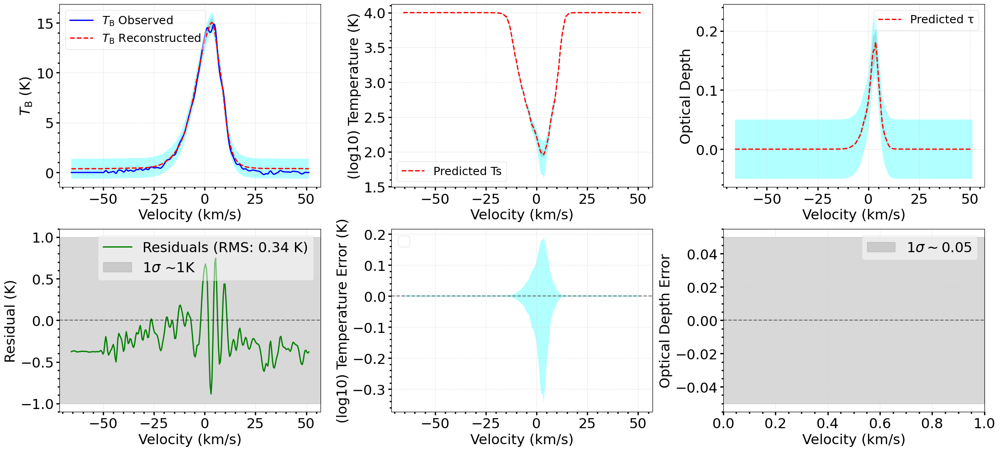

In [ ]:
visu(model, v, test_spectra, device, test_idx = 55)

Generating visualization...
test spectrum idx:  7


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


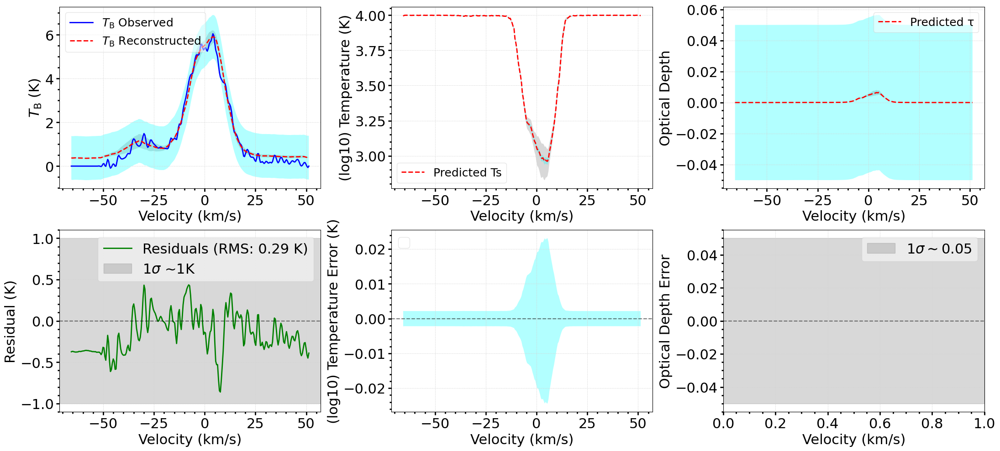

In [ ]:
visu(model, v, test_spectra, device, test_idx = 7)

Generating visualization...
test spectrum idx:  77


/jobfs/161907068.gadi-pbs/ipykernel_2717285/2673353518.py:61: RuntimeWarning: invalid value encountered in log10
  log10_lower_bound_linear50 = np.log10(lower_bound_linear50)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


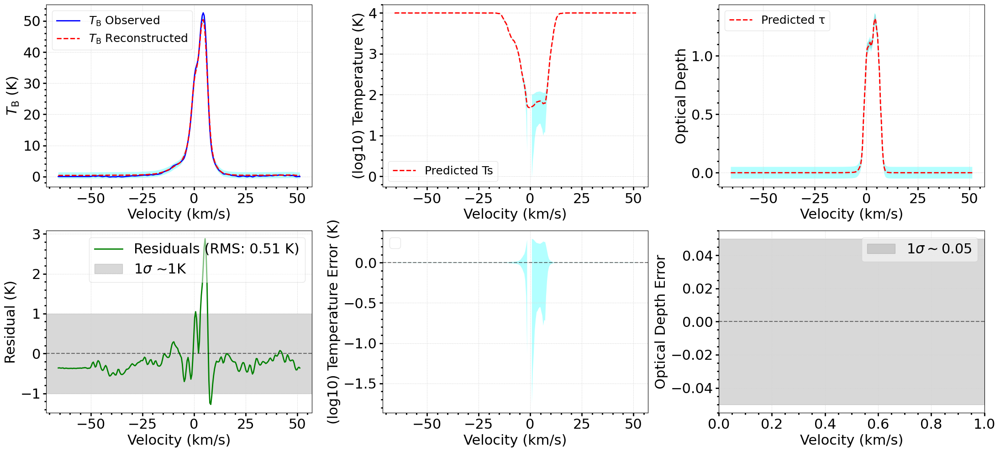

In [ ]:
visu(model, v, test_spectra, device, test_idx = 77)

# Cases with high TB

Generating visualization...
test spectrum idx:  0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


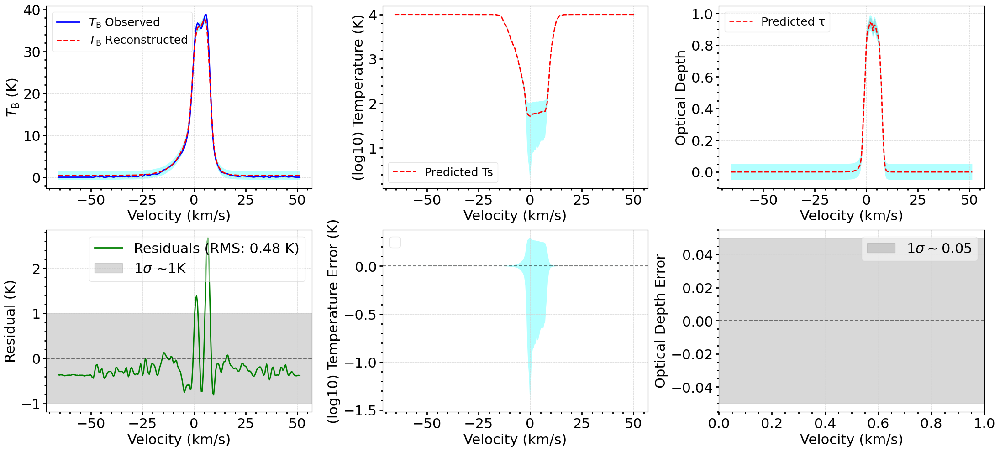

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[0]
visu(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


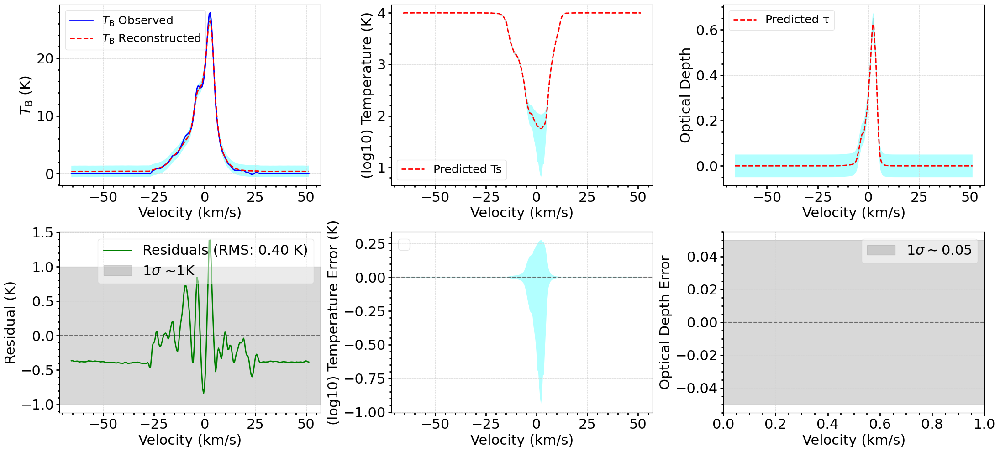

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[1]
visu(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  150


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


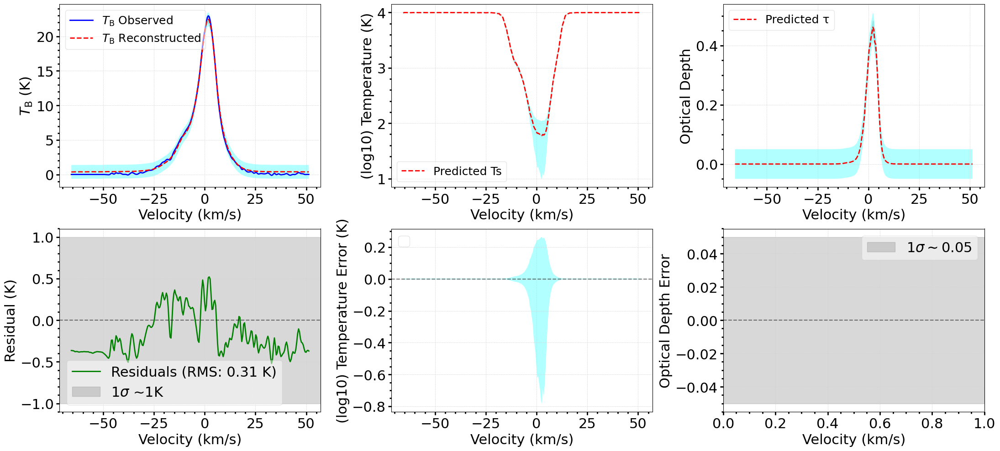

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[84]
visu(model, v, test_spectra, device, test_idx = test_idx)

# Plots without residuals

In [ ]:
from scipy.interpolate import UnivariateSpline, interp1d

def estimate_uncertainty(temperature_spectrum):
    """
    Estimate smooth uncertainty envelope for temperature spectrum using linear interpolation.

    Parameters:
    -----------
    temperature_spectrum : array-like
        Temperature values in Kelvin

    Returns:
    --------
    uncertainty : numpy array
        Smoothly interpolated uncertainty values corresponding to each temperature
    """
    temperature = np.array(temperature_spectrum)

    temp_points = np.array([3, 100, 300, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000])
    unc_points  = np.array([50, 50,  200, 600, 800, 900, 1000, 1500, 2000, 3000, 4000, 5000, 6000])

    interpolator = interp1d(temp_points, unc_points, kind='linear',
                           bounds_error=False, fill_value='extrapolate')
    uncertainty = interpolator(temperature)

    return uncertainty

In [ ]:
def visu1(model, v, test_spectra, device, test_idx = 0):
    # Visualize results on a test spectrum
    print("Generating visualization...")
    print('test spectrum idx: ', test_idx)

    test_spectrum = test_spectra[test_idx]  # Use first spectrum as test

    """
    Visualize the decomposition results for a single spectrum.

    Args:
        model: Trained model
        test_spectrum: Observed TB spectrum
        T_true: True temperature spectrum (ground truth)
        tau_true: True optical depth spectrum (ground truth)
        velocities: Velocity array
        device: Computing device
    """
    model.eval()
    with torch.no_grad():
        TB_obs = torch.FloatTensor(test_spectrum).unsqueeze(0).to(device)
        # T_HI, tau, TB_recon = model(TB_obs)
        T_HI_samples, tau_samples, TB_samples = model.sample_posterior(TB_obs, n_samples=512)
        # print(tau_samples)

        # Get mean and std for uncertainty quantification
        T_HI, _ = T_HI_samples.median(dim=0)
        T_HI_std = T_HI_samples.std(dim=0)
        tau, _ = tau_samples.median(dim=0)
        # print(tau)
        tau_std = tau_samples.std(dim=0)

        TB_recon, _ = TB_samples.median(dim=0)
        TB_recon_std = TB_samples.std(dim=0)

        # Move to CPU for plotting
        TB_obs = TB_obs.cpu().numpy()[0]

        T_HI = T_HI.cpu().numpy()[0]
        T_HI_std = T_HI_std.cpu().numpy()[0]

        uncertainty = estimate_uncertainty(T_HI)

        lower_bound_linear = T_HI - uncertainty
        upper_bound_linear = T_HI + uncertainty

        # Ensure bounds are positive before taking log10
        lower_bound_linear[lower_bound_linear <= 0] = 1e-6
        upper_bound_linear[upper_bound_linear <= 0] = 1e-6 # This should usually be fine if median and std are positive

        log10_lower_bound = np.log10(lower_bound_linear)
        log10_upper_bound = np.log10(upper_bound_linear)

        T_HI = np.log10(T_HI)
        T_HI_std = np.log10(T_HI_std)

        tau = tau.cpu().numpy()[0]
        tau_std = tau_std.cpu().numpy()[0]

        TB_recon = TB_recon.cpu().numpy()[0]
        TB_recon_std = TB_recon_std.cpu().numpy()[0]
    # End - with




    # Plots
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    fontsize = 29
    lgsize = 26

    # xlims
    x1 = -40.
    x2 = 40.

    lw=3

    # Plot 1: Observed vs Reconstructed
    ax = axes[0]
    ax.plot(v, TB_obs, 'b-', label=r'Observed $T_\mathrm{b}$', linewidth=lw+1)
    ax.plot(v, TB_recon, 'r--', label=r'Reconstructed $T_\mathrm{b}$', linewidth=lw)
    ax.fill_between(v, TB_recon-TB_recon_std, TB_recon+TB_recon_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, TB_recon-1., TB_recon+1., alpha=0.3, facecolor='cyan')
    ax.set_xlabel(r'Velocity [km s$^{-1}$]', fontsize=fontsize)
    ax.set_ylabel(r'$T_\mathrm{b}$ [K]', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.set_xlim(x1, x2)

    ax.legend(fancybox=True, loc='upper right', framealpha=0.5, labelcolor='k', fontsize=lgsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)



    # Plot 3: Predicted vs True Temperature
    ax = axes[1]
    ax.plot(v, T_HI, 'r--', label=r'Inferred $T_\text{s}$', linewidth=lw)
    ax.fill_between(v, log10_lower_bound, log10_upper_bound, alpha=0.3, facecolor='cyan')
    # ax.fill_between(v, log10_lower_bound_linear50, log10_upper_bound_linear50, alpha=0.3, facecolor='cyan')
    ax.set_xlabel(r'Velocity [km s$^{-1}$]', fontsize=fontsize)
    ax.set_ylabel('log10 (temperature) [K]', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.set_xlim(x1, x2)
    ax.set_ylim(0.35, 4.5)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)




    # Plot 4: Predicted vs True Optical Depth
    ax = axes[2]
    ax.plot(v, tau, 'r--', label='Inferred τ', linewidth=lw)
    ax.fill_between(v, tau-tau_std, tau+tau_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, tau-0.05, tau+0.05, alpha=0.3, facecolor='cyan')
    ax.set_xlabel(r'Velocity [km s$^{-1}$]', fontsize=fontsize)
    ax.set_ylabel(r'Optical depth τ', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.set_xlim(x1, x2)

    ax.legend(fancybox=True, framealpha=0.1, labelcolor='k', fontsize=lgsize) # loc='upper left'
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    ###
    plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.9,
                    hspace=0.0
                    )

    plt.tight_layout()
    plt.savefig(img_path / f'res{test_idx}.png', dpi=300, bbox_inches='tight')
    plt.show()

Generating visualization...
test spectrum idx:  78


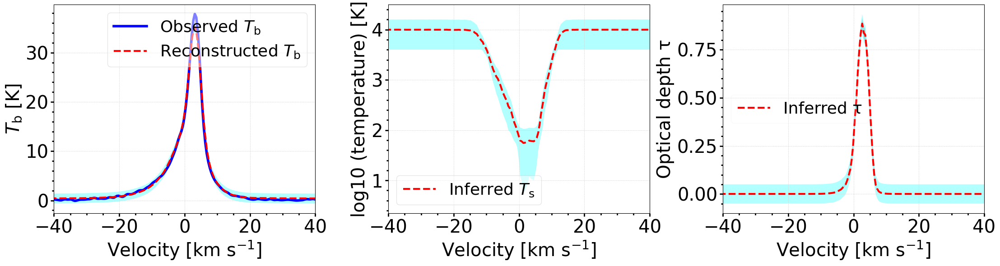

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[45]
visu1(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  39


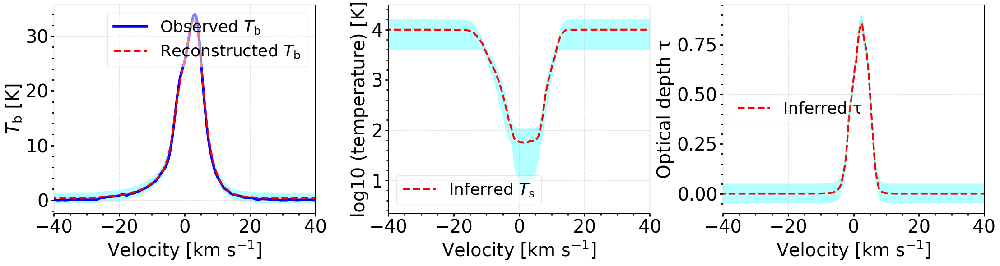

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[21]
visu1(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  131


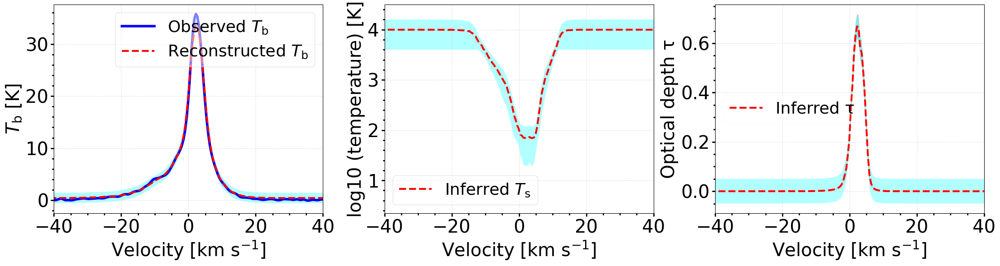

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[72]
visu1(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  144


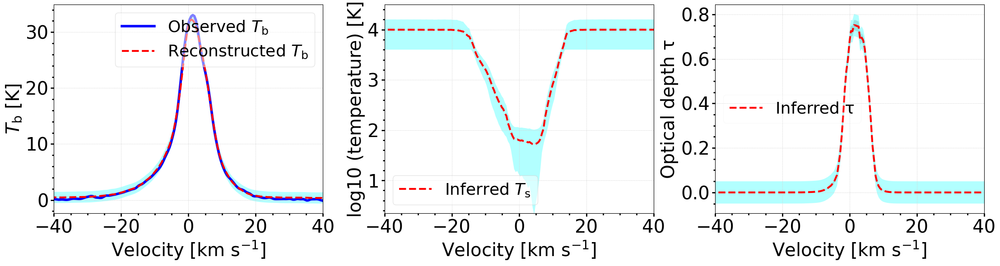

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[79]
visu1(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  133


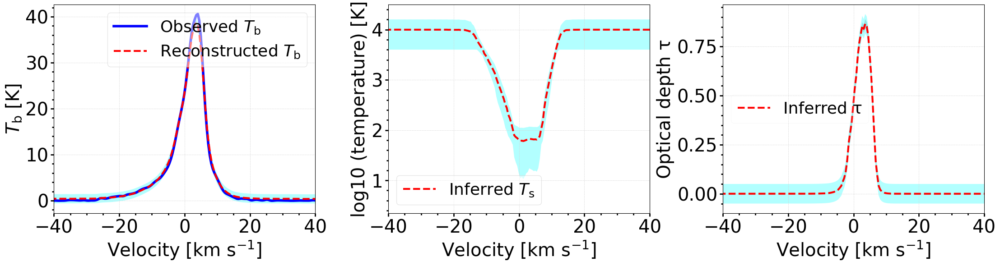

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[73]
visu1(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  122


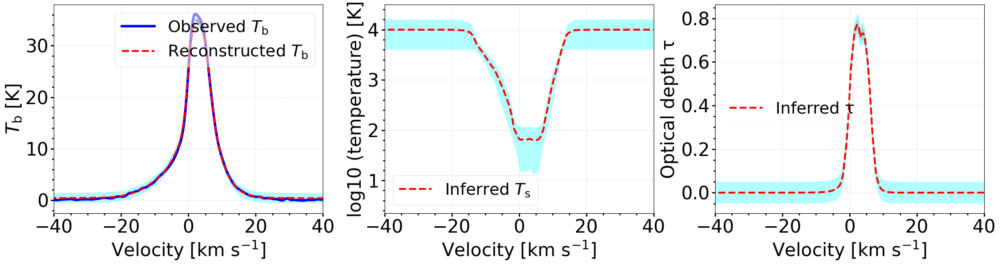

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[66]
visu1(model, v, test_spectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  24


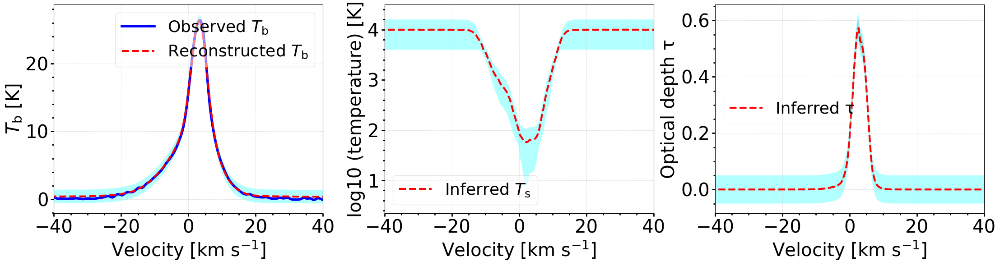

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[11]
visu1(model, v, test_spectra, device, test_idx = test_idx)

# Check the infered tau vs Tspin

In [ ]:
n_spectra, nchan = test_spectra.shape
print(n_spectra, nchan)

2000 256


In [ ]:
model.eval()
model = model.to(device)

batch_size = 512

test_spectra_tensor = torch.FloatTensor(test_spectra)

In [ ]:
# Process in batches
TB_recon_test_list = []
ts_test_spectra = []
tau_test_spectra = []

with torch.no_grad():
    for i in range(0, n_spectra, batch_size):
        batch = test_spectra_tensor[i:i+batch_size].to(device)

        # Forward pass
        TB_recon, log10_T_HI, tau, _, _ = model(batch)

        # Convert to physical units
        T_HI = 10 ** log10_T_HI

        # Move to CPU and store
        TB_recon_test_list.append(TB_recon.cpu().numpy())
        ts_test_spectra.append(T_HI.cpu().numpy())
        tau_test_spectra.append(tau.cpu().numpy())

        # Progress
        if (i // batch_size) % 10 == 0:
            print(f"Processed {i}/{n_spectra} spectra ({100*i/n_spectra:.1f}%)")

# Concatenate results
TB_recon_test = np.concatenate(TB_recon_test_list, axis=0)
ts_test_spectra = np.concatenate(ts_test_spectra, axis=0)
tau_test_spectra = np.concatenate(tau_test_spectra, axis=0)

Processed 0/2000 spectra (0.0%)


In [ ]:
tau_test_spectra.shape

(2000, 256)

In [ ]:
tau_peak_test = np.max(tau_test_spectra, axis=1)
tau_peak_test.shape

(2000,)

In [ ]:
tau_peak_idx = np.argmax(tau_test_spectra, axis=1)
tau_peak_idx.shape

(2000,)

In [ ]:
x_indices = np.indices(tau_peak_idx.shape)
x_indices.shape

(1, 2000)

In [ ]:
ts_associated_test = ts_test_spectra[x_indices, tau_peak_idx]
ts_associated_test.shape

(1, 2000)

In [ ]:
tau_peak_test_all = tau_peak_test.flatten()
ts_test_all = ts_associated_test.flatten()

In [ ]:
tau_peak_log10 = np.log10(tau_peak_test_all)
ts_log10 = np.log10(ts_test_all)

In [ ]:
tau_peak_vals = np.linspace(0.0001, 20, num=500)
tau_peak_vals_log10 = np.log10(tau_peak_vals)

ts_expected = 28.4 * ((1. - np.exp(-tau_peak_vals))**(-0.48) )
log10_ts_expected = np.log10(ts_expected)

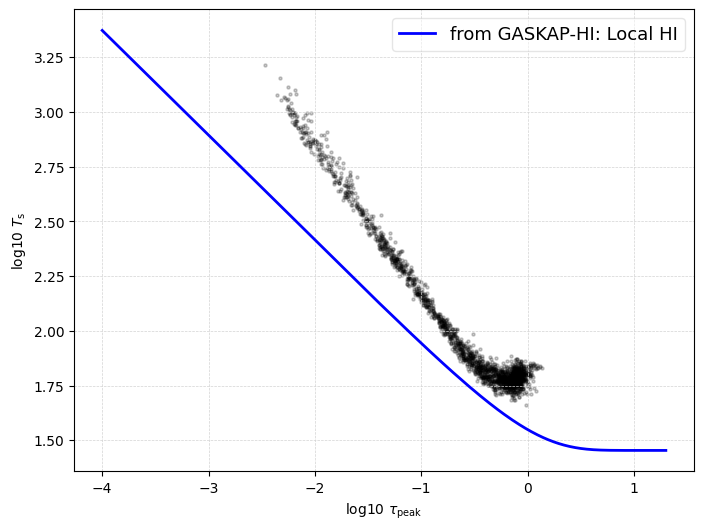

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    tau_peak_log10,
    ts_log10,
    c='k',
    s=5,
    alpha=0.2
)

plt.plot(tau_peak_vals_log10, log10_ts_expected, 'b-', lw=2, label='from GASKAP-HI: Local HI')

# Add labels and title
plt.title('')
plt.xlabel(r'log10 $\tau_\mathrm{peak}$')
plt.ylabel(r'log10 $T_\mathrm{s}$')

plt.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=13) # loc='upper left'
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

# Display the plot
plt.show()

# Maps of inferred (peak) optical depths and gas temperatures

In [ ]:
def process_cube_batched(model, data_cube, batch_size=512, device='cuda', normalize_params=None):
    """
    Process entire data cube in batches (FAST!)

    Args:
        model: trained HI_VAE model
        data_cube: numpy array of shape (nv, ny, nx) where nv=256 (velocity channels)
                   or (n_spectra, 256) for already flattened data
        batch_size: number of spectra to process at once (larger = faster, uses more GPU memory)
        device: 'cuda' or 'cpu'
        normalize_params: dict with 'mean' and 'std' from training dataset

    Returns:
        TB_recon: reconstructed brightness temperature, same shape as input
        T_HI: HI spin temperature, same shape as input
        tau: optical depth, same shape as input
    """
    model.eval()
    model = model.to(device)

    # Reshape cube if needed
    original_shape = data_cube.shape
    if len(original_shape) == 3:  # (nv, ny, nx) - standard astronomical format
        nv, ny, nx = original_shape
        data_cube = data_cube.transpose(1, 2, 0).reshape(-1, nv)  # (ny*nx, 256)

    n_spectra = data_cube.shape[0]

    # Normalize data if parameters provided
    if normalize_params is not None:
        mean = normalize_params['mean']
        std = normalize_params['std']
        data_cube = (data_cube - mean) / std

    # Convert to tensor
    data_tensor = torch.FloatTensor(data_cube)

    # Process in batches
    TB_recon_list = []
    T_HI_list = []
    tau_list = []

    with torch.no_grad():
        for i in range(0, n_spectra, batch_size):
            batch = data_tensor[i:i+batch_size].to(device)

            # Forward pass
            TB_recon, log10_T_HI, tau, _, _ = model(batch)

            # Convert to physical units
            T_HI = 10 ** log10_T_HI

            # Move to CPU and store
            TB_recon_list.append(TB_recon.cpu().numpy())
            T_HI_list.append(T_HI.cpu().numpy())
            tau_list.append(tau.cpu().numpy())

            # Progress
            if (i // batch_size) % 10 == 0:
                print(f"Processed {i}/{n_spectra} spectra ({100*i/n_spectra:.1f}%)")

    # Concatenate results
    TB_recon = np.concatenate(TB_recon_list, axis=0)
    T_HI = np.concatenate(T_HI_list, axis=0)
    tau = np.concatenate(tau_list, axis=0)

    # Denormalize TB_recon if needed
    if normalize_params is not None:
        TB_recon = TB_recon * std + mean

    # Reshape back to original cube format if input was 3D
    if len(original_shape) == 3:  # (nv, ny, nx)
        nv, ny, nx = original_shape
        # Reshape from (ny*nx, 256) back to (nv, ny, nx)
        TB_recon = TB_recon.reshape(ny, nx, nv).transpose(2, 0, 1)  # (nv, ny, nx)
        T_HI = T_HI.reshape(ny, nx, nv).transpose(2, 0, 1)
        tau = tau.reshape(ny, nx, nv).transpose(2, 0, 1)

    print(f"Done! Processed {n_spectra} spectra")
    return TB_recon, T_HI, tau


def process_cube_with_uncertainty(model, data_cube, n_samples=100, batch_size=256,
                                   device='cuda', normalize_params=None):
    """
    Process data cube with uncertainty quantification (slower but gives uncertainties)

    Args:
        model: trained HI_VAE model
        data_cube: numpy array of shape (nv, ny, nx) where nv=256 (velocity channels)
                   or (n_spectra, 256) for already flattened data
        n_samples: number of posterior samples for uncertainty
        batch_size: number of spectra to process at once
        device: 'cuda' or 'cpu'
        normalize_params: dict with 'mean' and 'std' from training dataset

    Returns:
        T_HI_mean, T_HI_std: mean and std of HI temperature, same shape as input
        tau_mean, tau_std: mean and std of optical depth, same shape as input
        TB_recon_mean, TB_recon_std: mean and std of reconstructed TB, same shape as input
    """
    model.eval()
    model = model.to(device)

    # Reshape cube if needed
    original_shape = data_cube.shape
    if len(original_shape) == 3:  # (nv, ny, nx)
        nv, ny, nx = original_shape
        # Reshape to (ny*nx, nv)
        data_cube = data_cube.transpose(1, 2, 0).reshape(-1, nv)

    n_spectra = data_cube.shape[0]

    # Normalize
    if normalize_params is not None:
        mean = normalize_params['mean']
        std = normalize_params['std']
        data_cube = (data_cube - mean) / std

    data_tensor = torch.FloatTensor(data_cube)

    # Storage for results
    T_HI_mean_list = []
    T_HI_std_list = []
    tau_mean_list = []
    tau_std_list = []
    TB_mean_list = []
    TB_std_list = []

    with torch.no_grad():
        for i in range(0, n_spectra, batch_size):
            batch = data_tensor[i:i+batch_size].to(device)

            # Sample posterior
            T_HI_samples, tau_samples, TB_samples = model.sample_posterior(batch, n_samples=n_samples)

            # Compute statistics
            T_HI_mean = T_HI_samples.mean(dim=0).cpu().numpy()
            T_HI_std = T_HI_samples.std(dim=0).cpu().numpy()
            tau_mean = tau_samples.mean(dim=0).cpu().numpy()
            tau_std = tau_samples.std(dim=0).cpu().numpy()
            TB_mean = TB_samples.mean(dim=0).cpu().numpy()
            TB_std = TB_samples.std(dim=0).cpu().numpy()

            T_HI_mean_list.append(T_HI_mean)
            T_HI_std_list.append(T_HI_std)
            tau_mean_list.append(tau_mean)
            tau_std_list.append(tau_std)
            TB_mean_list.append(TB_mean)
            TB_std_list.append(TB_std)

            if (i // batch_size) % 10 == 0:
                print(f"Processed {i}/{n_spectra} spectra with uncertainty ({100*i/n_spectra:.1f}%)")

    # Concatenate
    T_HI_mean = np.concatenate(T_HI_mean_list, axis=0)
    T_HI_std = np.concatenate(T_HI_std_list, axis=0)
    tau_mean = np.concatenate(tau_mean_list, axis=0)
    tau_std = np.concatenate(tau_std_list, axis=0)
    TB_mean = np.concatenate(TB_mean_list, axis=0)
    TB_std = np.concatenate(TB_std_list, axis=0)

    # Denormalize
    if normalize_params is not None:
        TB_mean = TB_mean * std + mean
        TB_std = TB_std * std  # std scales with normalization std

    # Reshape back to original cube format if input was 3D
    if len(original_shape) == 3:  # (nv, ny, nx)
        nv, ny, nx = original_shape
        # Reshape from (ny*nx, 256) back to (nv, ny, nx)
        T_HI_mean = T_HI_mean.reshape(ny, nx, nv).transpose(2, 0, 1)
        T_HI_std = T_HI_std.reshape(ny, nx, nv).transpose(2, 0, 1)
        tau_mean = tau_mean.reshape(ny, nx, nv).transpose(2, 0, 1)
        tau_std = tau_std.reshape(ny, nx, nv).transpose(2, 0, 1)
        TB_mean = TB_mean.reshape(ny, nx, nv).transpose(2, 0, 1)
        TB_std = TB_std.reshape(ny, nx, nv).transpose(2, 0, 1)

    print(f"Done! Processed {n_spectra} spectra with uncertainty")
    return T_HI_mean, T_HI_std, tau_mean, tau_std, TB_mean, TB_std

In [ ]:
resampled_test_cube.shape

(256, 144, 2310)

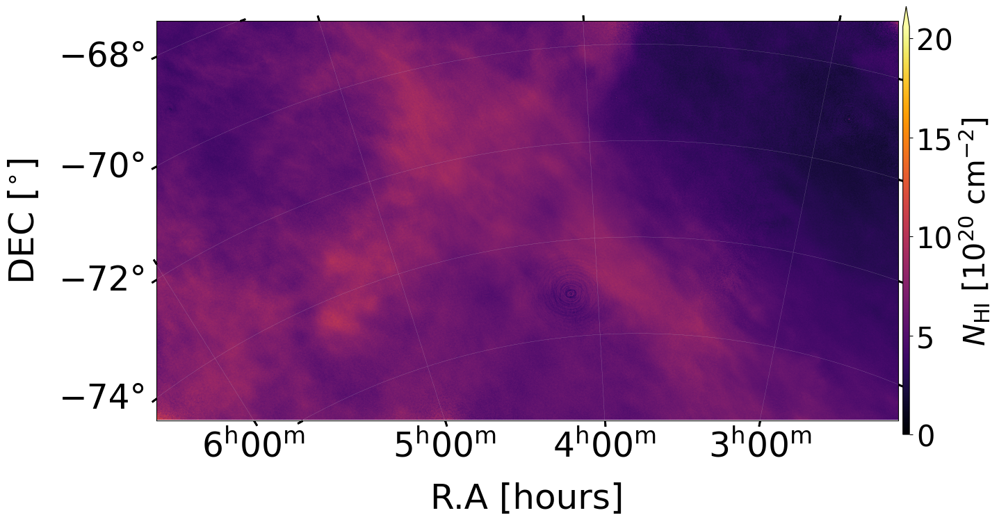

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D)

# Display the moment map image
im = ax.imshow(nhi, cmap='inferno', vmin=0.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)


# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=65)
cbar.ax.set_ylabel(r'$N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=31)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

In [ ]:
print("Fast batched inference ---")
import time
start = time.time()

Fast batched inference ---


In [ ]:
print("Inference with uncertainty quantification ---")
start = time.time()

T_HI_mean, T_HI_std, tau_mean, tau_std, TB_mean, TB_std = process_cube_with_uncertainty(
    model,
    resampled_cube,
    n_samples=128,  # Reduce for speed, increase for better uncertainty estimates
    batch_size=512,
    device=device,
    normalize_params=None
)

elapsed = time.time() - start
print(f"Time elapsed: {elapsed:.2f} seconds")
print(f"Speed: {(nx*ny)/elapsed:.1f} spectra/second")

np.save(npy_path / f'T_HI_mean_cube_mod_all_mw_2800k.npy', T_HI_mean)
np.save(npy_path / f'T_HI_std_cube_mod_all_mw_2800k.npy', T_HI_std)
np.save(npy_path / f'tau_mean_cube_mod_all_mw_2800k.npy', tau_mean)
np.save(npy_path / f'tau_std_cube_mod_all_mw_2800k.npy', tau_std)
print("Saved results with uncertainties")

Inference with uncertainty quantification ---
Processed 0/2873640 spectra with uncertainty (0.0%)
Processed 5120/2873640 spectra with uncertainty (0.2%)
Processed 10240/2873640 spectra with uncertainty (0.4%)
Processed 15360/2873640 spectra with uncertainty (0.5%)
Processed 20480/2873640 spectra with uncertainty (0.7%)
Processed 25600/2873640 spectra with uncertainty (0.9%)
Processed 30720/2873640 spectra with uncertainty (1.1%)
Processed 35840/2873640 spectra with uncertainty (1.2%)
Processed 40960/2873640 spectra with uncertainty (1.4%)
Processed 46080/2873640 spectra with uncertainty (1.6%)
Processed 51200/2873640 spectra with uncertainty (1.8%)
Processed 56320/2873640 spectra with uncertainty (2.0%)
Processed 61440/2873640 spectra with uncertainty (2.1%)
Processed 66560/2873640 spectra with uncertainty (2.3%)
Processed 71680/2873640 spectra with uncertainty (2.5%)
Processed 76800/2873640 spectra with uncertainty (2.7%)
Processed 81920/2873640 spectra with uncertainty (2.9%)
Process

In [ ]:
T_HI_mean_cube = np.load(npy_path / f'T_HI_mean_cube_mod_all_mw_2800k.npy')
T_HI_mean_cube.shape

(256, 1244, 2310)

In [ ]:
tau_mean_cube = np.load(npy_path / f'tau_mean_cube_mod_all_mw_2800k.npy')
tau_mean_cube.shape

(256, 1244, 2310)

# Inferred maps of optical depths and gas temperatures in the Milky Way from GASKAP HI data

## Milky Way: Column density map

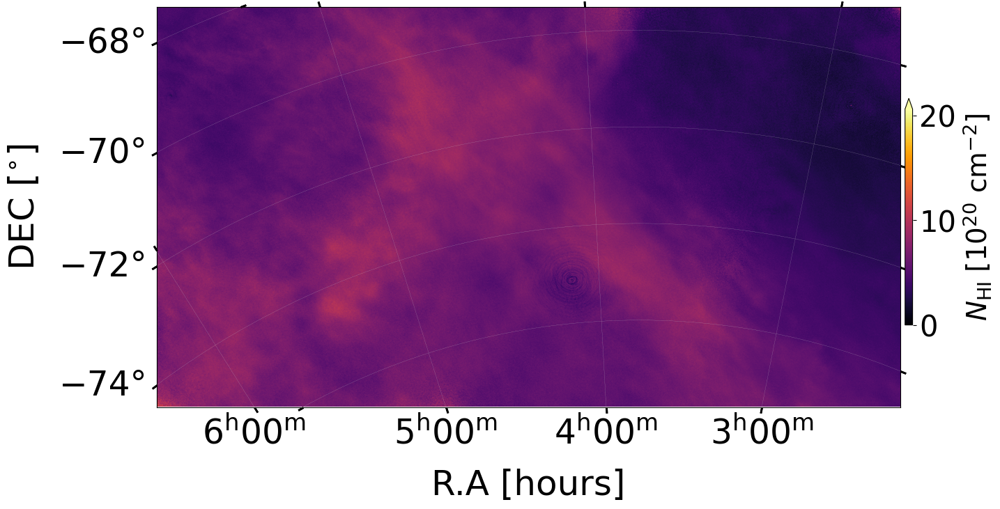

In [ ]:
test_start = 0
test_end = 1244

xlbs = 36
tlbs = 35
cmap = 'viridis'

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D)

# Display the moment map image
im = ax.imshow(nhi[test_start:test_end, :], cmap='inferno', vmin=0.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=30)
cbar.ax.set_ylabel(r'$N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=28)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

## Milky Way: inferred optical depths

In [ ]:
tau_peak = np.max(tau_mean_cube, axis=0)
tau_peak_values = tau_peak.flatten()
tau_peak_values.shape

(2873640,)

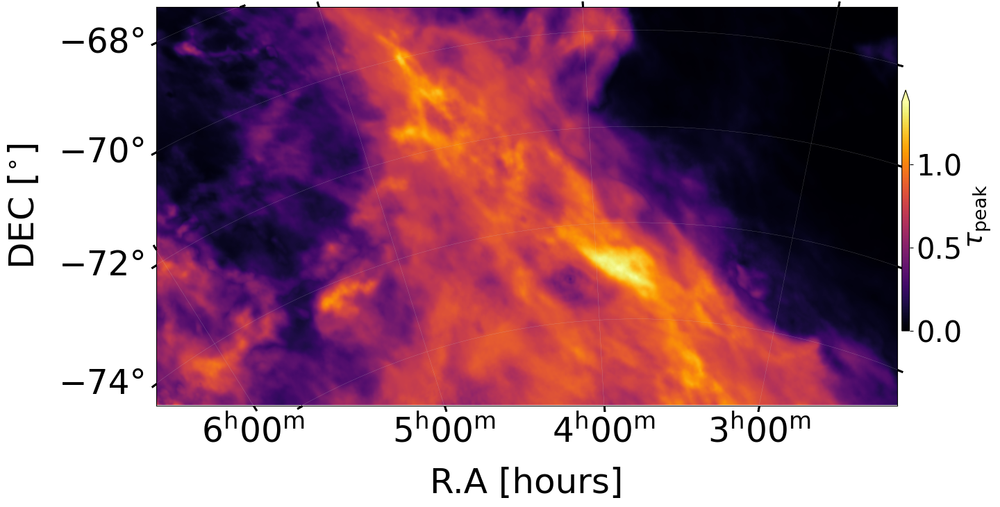

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'


fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D)

# Display the moment map image
im = ax.imshow(tau_peak, cmap='inferno', vmin=0.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=32)
cbar.ax.set_ylabel(r'$\tau_\mathrm{peak}$', rotation=90, labelpad=5., fontsize=28)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

In [ ]:
stats_series = pd.DataFrame(tau_peak_values).describe()
series_index = stats_series.index.to_list()
series_values = stats_series.values.flatten()
stats_series

,0
count,2.873640e+06
mean,4.286498e-01
std,3.188684e-01
min,4.091037e-03
25%,1.036109e-01
50%,4.062995e-01
75%,7.238721e-01
max,1.377286e+00


In [ ]:
x_count = int(series_values[0])
x_mean = round(series_values[1], 2)
x_std = round(series_values[2], 2)
x_minval = round(series_values[3], 4)
x_maxval = round(series_values[-1], 2)
x_median = round(series_values[5], 2)
x_labels = ['Counts', 'Mean', 'Median', 'std', 'Min', 'Max']
x_stats_values = [x_count, x_mean, x_median, x_std, x_minval, x_maxval]

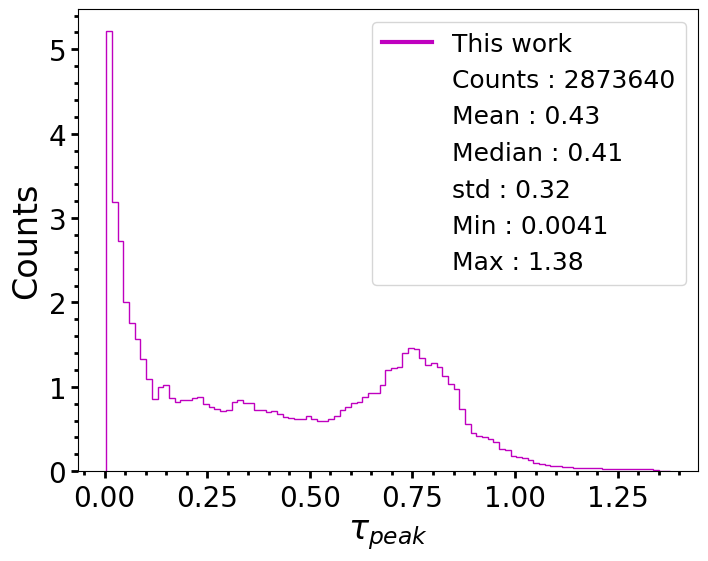

In [ ]:
plt.figure(figsize=(8, 6))

plt.hist(tau_peak_values, bins=np.linspace(np.nanmin(tau_peak_values), np.nanmax(tau_peak_values), 100),
         density=True, color='m', histtype='step',
         alpha=1., ls='-', lw=1,
         label='')

ploti, = plt.plot([], [], 'm-', lw=3, label=f'This work')
ploti.set_visible(True)

for labeli,vali in zip(x_labels, x_stats_values):
    ploti, = plt.plot([], [], '', label=f"{labeli} : {vali}")
    ploti.set_visible(False)


plt.minorticks_on()
plt.tick_params(axis='x', labelsize=20, pad=4)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(which='both', width=2)
plt.tick_params(which='major', length=5)
plt.tick_params(which='minor', length=3)

plt.xlabel(r'$\tau_{peak}$', fontsize=24)
plt.ylabel(r'Counts', fontsize=24)

plt.legend(loc='upper right', fontsize=18)
plt.show()

## Milky Way: inferred gas temperatures

In [ ]:
ts_min_map = np.min(T_HI_mean_cube, axis=0)
ts_min_values = ts_min_map.flatten()
ts_min_values.shape

(2873640,)

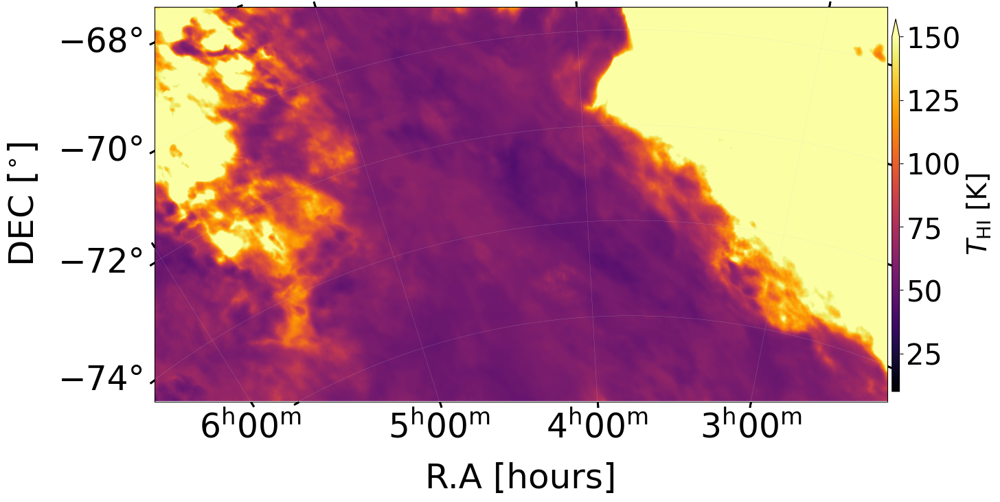

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D)

# Display the moment map image
im = ax.imshow(ts_min_map, cmap='inferno', vmin=10., vmax=150.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=50)
cbar.ax.set_ylabel(r'$T_\mathrm{HI}$ [K]', rotation=90, labelpad=5., fontsize=28)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

In [ ]:
stats_series = pd.DataFrame(ts_min_values).describe()
series_index = stats_series.index.to_list()
series_values = stats_series.values.flatten()
stats_series

,0
count,2.873640e+06
mean,1.554730e+02
std,2.018180e+02
min,4.272116e+01
25%,5.737683e+01
50%,6.475012e+01
75%,1.456592e+02
max,1.458265e+03


In [ ]:
x_count = int(series_values[0])
x_mean = round(series_values[1], 2)
x_std = round(series_values[2], 2)
x_minval = round(series_values[3], 4)
x_maxval = round(series_values[-1], 2)
x_median = round(series_values[5], 2)
x_labels = ['Counts', 'Mean', 'Median', 'std', 'Min', 'Max']
x_stats_values = [x_count, x_mean, x_median, x_std, x_minval, x_maxval]

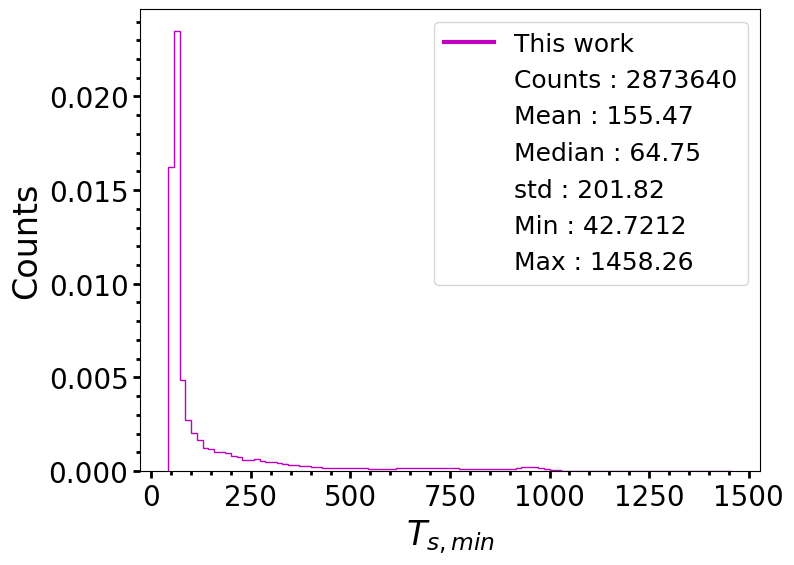

In [ ]:
plt.figure(figsize=(8, 6))

plt.hist(ts_min_values, bins=np.linspace(np.nanmin(ts_min_values), np.nanmax(ts_min_values), 100),
         density=True, color='m', histtype='step',
         alpha=1., ls='-', lw=1,
         label='')

ploti, = plt.plot([], [], 'm-', lw=3, label=f'This work')
ploti.set_visible(True)

for labeli,vali in zip(x_labels, x_stats_values):
    ploti, = plt.plot([], [], '', label=f"{labeli} : {vali}")
    ploti.set_visible(False)


plt.minorticks_on()
plt.tick_params(axis='x', labelsize=20, pad=4)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(which='both', width=2)
plt.tick_params(which='major', length=5)
plt.tick_params(which='minor', length=3)

plt.xlabel(r'$T_{s,min}$', fontsize=24)
plt.ylabel(r'Counts', fontsize=24)

plt.legend(loc='upper right', fontsize=18)
plt.show()

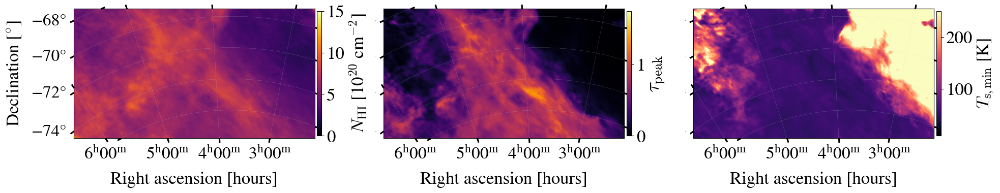

In [ ]:
xlbs = 25
tlbs = 24
cmap = 'viridis'


fig = plt.figure(figsize=(22,13))


ax = fig.add_subplot(131, projection=wcs2D)

# Display the moment map image
im = ax.imshow(nhi, cmap='inferno', origin='lower', vmin=0., vmax=15.)
ax.text(2120, 200, "Milky Way", fontsize=30, rotation=90, color='w')


# Title
ax.set_title(f'GASKAP emission data (inputs)', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel(r'Declination [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=28) # extend='max'
cbar.ax.set_ylabel(r'$N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)







######
ax = fig.add_subplot(132, projection=wcs2D)

# Display the moment map image
im = ax.imshow(tau_peak, cmap='inferno', origin='lower', vmin=0., vmax=1.75)


# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)


# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=28) # extend='max',
cbar.ax.set_ylabel(r'$\tau_\mathrm{peak}$', rotation=90, labelpad=5., fontsize=xlbs+3)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)




######
ax = fig.add_subplot(133, projection=wcs2D)

# Display the moment map image
im = ax.imshow(ts_min_map, cmap='magma', origin='lower', vmin=10., vmax=250.)

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=28) # extend='max'
cbar.ax.set_ylabel(r'$T_\mathrm{s,min}$ [K]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)

# set the spacing between subplots
plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.25,
                    hspace=0.
                    )

plt.savefig(img_path / f'gaskap_inferred_mw_fg_maps.png', dpi=300, bbox_inches='tight')
plt.show()

# Inferred maps of optical depths and gas temperatures in the LMC from GASKAP HI data

In [ ]:
gaskap_pilot_cube = cube_path / 'Tb_combined_LMC_60arcsec_1km_vel_slab.fits'
cube, hdr = fits.getdata(gaskap_pilot_cube, header=True)
cube.shape

(171, 1055, 1126)

In [ ]:
dv = hdr['CDELT3'] / 1000.
dv

1.0

In [ ]:
wcs3D_lmc = WCS(hdr)
print(wcs3D_lmc)

WCS Keywords

Number of WCS axes: 3
CTYPE : 'RA---TAN' 'DEC--TAN' 'VOPT'
CUNIT : 'deg' 'deg' 'm / s'
CRVAL : 56.755694111202 -72.799170553189 43840.953065363
CRPIX : 1554.0 262.0 -122.0
PC1_1 PC1_2 PC1_3  : 1.0 0.0 0.0
PC2_1 PC2_2 PC2_3  : 0.0 1.0 0.0
PC3_1 PC3_2 PC3_3  : 0.0 0.0 1.0
CDELT : -0.00666666 0.00666666 1000.0
NAXIS : 1126  1055  171


In [ ]:
wcs2D_lmc = wcs3D_lmc.celestial
wcs2D_lmc

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN'
CUNIT : 'deg' 'deg'
CRVAL : 56.755694111202 -72.799170553189
CRPIX : 1554.0 262.0
PC1_1 PC1_2  : 1.0 0.0
PC2_1 PC2_2  : 0.0 1.0
CDELT : -0.00666666 0.00666666
NAXIS : 1126  1055

In [ ]:
m0_lmc_map = np.sum(cube, axis=0)*dv

In [ ]:
nhi_lmc = 0.018224*m0_lmc_map

In [ ]:
lmc_npy_path = data_path / 'npy' / 'lmc0'
lmc_npy_path

PosixPath('/scratch/xt61/vn9735/data/npy/lmc0')

In [ ]:
tau_mean_cube_mod1 = np.load(lmc_npy_path / 'tau_mean_cube_mod1_800_1000.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod1.shape

(256, 255, 1126)

In [ ]:
tau_mean_cube_mod2 = np.load(lmc_npy_path / 'tau_mean_cube_mod2_0_200.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod2.shape

(256, 200, 1126)

In [ ]:
tau_mean_cube_mod3 = np.load(lmc_npy_path / 'tau_mean_cube_mod6_200_300.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod3.shape

(256, 100, 1126)

In [ ]:
tau_mean_cube_mod3b = np.load(lmc_npy_path / 'tau_mean_cube_mod7_300_400.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod3b.shape

(256, 100, 1126)

In [ ]:
tau_mean_cube_mod4 = np.load(lmc_npy_path / 'tau_mean_cube_mod8_400_500.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod4.shape

(256, 100, 1126)

In [ ]:
tau_mean_cube_mod4b = np.load(lmc_npy_path / 'tau_mean_cube_mod9_500_600.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod4b.shape

(256, 100, 1126)

In [ ]:
tau_mean_cube_mod5 = np.load(lmc_npy_path / 'tau_mean_cube_mod5_600_800.npy') # np.save('T_HI_mean_cube.npy', T_HI_mean)
tau_mean_cube_mod5.shape

(256, 200, 1126)

In [ ]:
combined_tau_lmc = np.concatenate([tau_mean_cube_mod2, tau_mean_cube_mod3, tau_mean_cube_mod3b, tau_mean_cube_mod4, tau_mean_cube_mod4b, tau_mean_cube_mod5, tau_mean_cube_mod1], axis=1)
combined_tau_lmc.shape

(256, 1055, 1126)

## LMC: Column density map

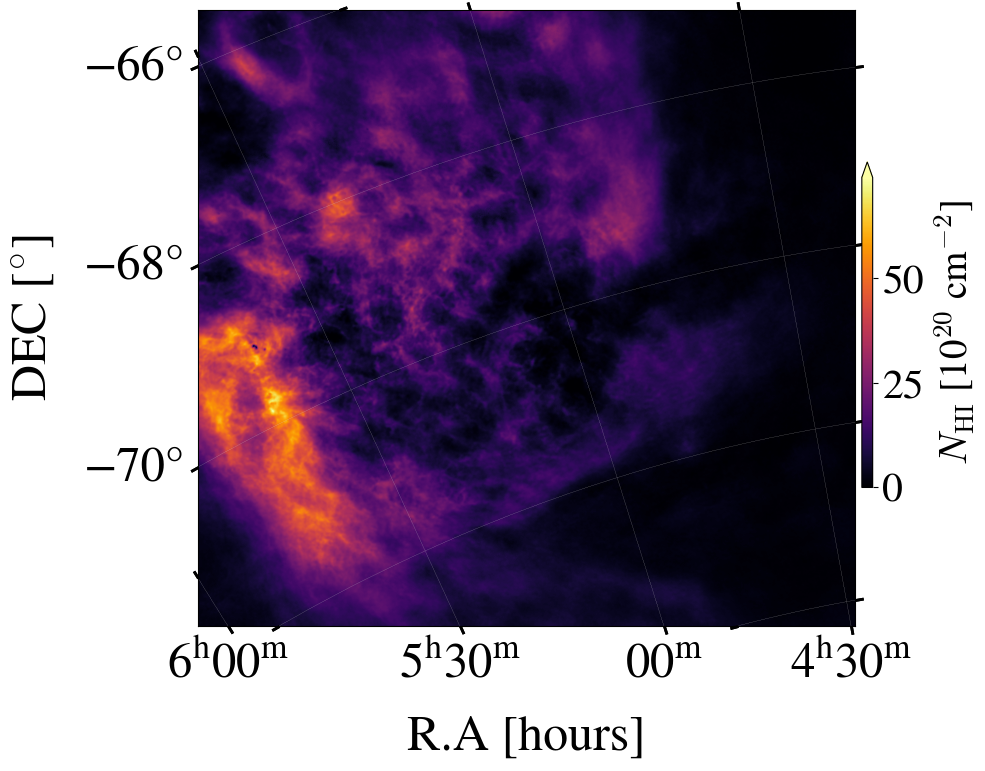

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(nhi_lmc, cmap='inferno', vmin=0.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=30)
cbar.ax.set_ylabel(r'$N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=28)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

## LMC: inferred optical depths

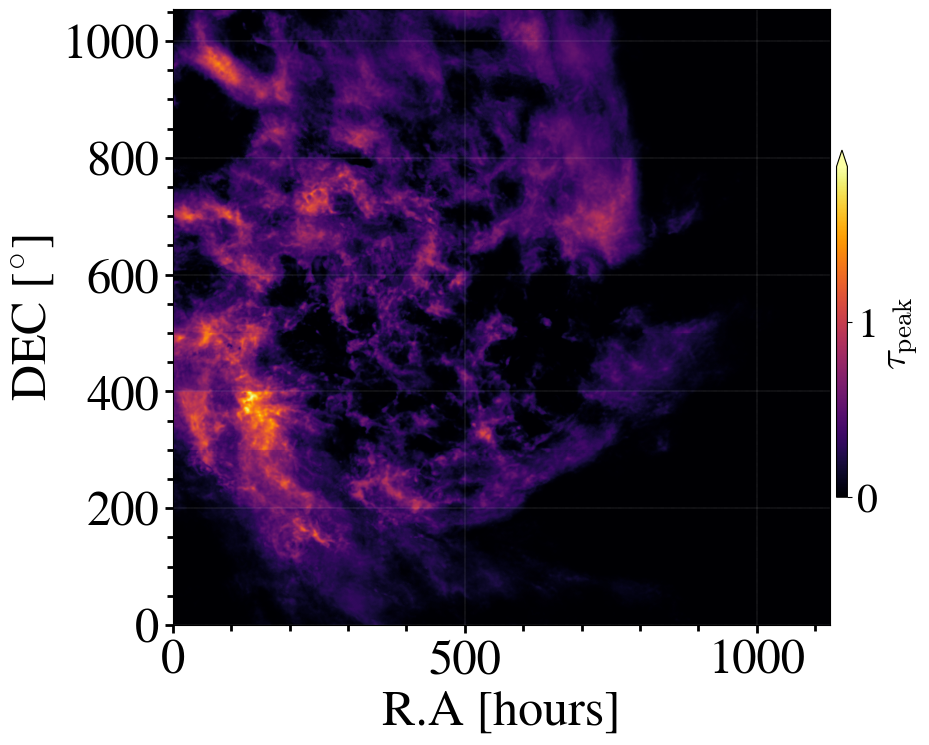

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'


fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111)

# Display the moment map image
im = ax.imshow(np.max(combined_tau_lmc, axis=0), cmap='inferno', vmin=0., origin='lower')

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=32)
cbar.ax.set_ylabel(r'$\tau_\mathrm{peak}$', rotation=90, labelpad=5., fontsize=28)
cbar.ax.tick_params(labelsize=30)


ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

## LMC: inferred gas temperatures

In [ ]:
T_HI_cube_mod1 = np.load(lmc_npy_path / 'T_HI_mean_cube_mod1_800_1000.npy')
T_HI_cube_mod1.shape

(256, 255, 1126)

In [ ]:
T_HI_cube_mod2 = np.load(lmc_npy_path / 'T_HI_mean_cube_mod2_0_200.npy')
T_HI_cube_mod2.shape

(256, 200, 1126)

In [ ]:
T_HI_cube_mod3 = np.load(lmc_npy_path / 'T_HI_mean_cube_mod6_200_300.npy')
T_HI_cube_mod3.shape

(256, 100, 1126)

In [ ]:
T_HI_cube_mod3b = np.load(lmc_npy_path / 'T_HI_mean_cube_mod7_300_400.npy')
T_HI_cube_mod3b.shape

(256, 100, 1126)

In [ ]:
T_HI_cube_mod4 = np.load(lmc_npy_path / 'T_HI_mean_cube_mod8_400_500.npy')
T_HI_cube_mod4.shape

(256, 100, 1126)

In [ ]:
T_HI_cube_mod4b = np.load(lmc_npy_path / 'T_HI_mean_cube_mod9_500_600.npy')
T_HI_cube_mod4b.shape

(256, 100, 1126)

In [ ]:
T_HI_cube_mod5 = np.load(lmc_npy_path / 'T_HI_mean_cube_mod5_600_800.npy')
T_HI_cube_mod5.shape

(256, 200, 1126)

In [ ]:
combined_ts_lmc = np.concatenate([T_HI_cube_mod2, T_HI_cube_mod3, T_HI_cube_mod3b, T_HI_cube_mod4, T_HI_cube_mod4b, T_HI_cube_mod5, T_HI_cube_mod1], axis=1)
combined_ts_lmc.shape

(256, 1055, 1126)

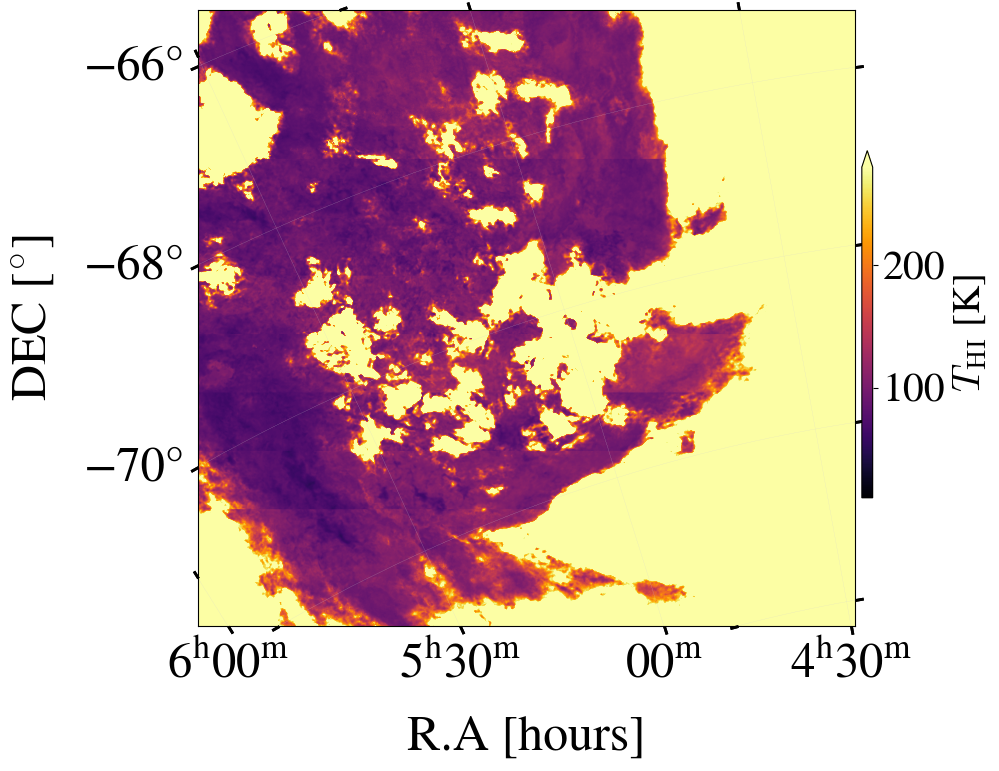

In [ ]:
xlbs = 36
tlbs = 35
cmap = 'viridis'

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(np.min(combined_ts_lmc, axis=0), cmap='inferno', vmin=10., vmax=280.)

# Add axes labels
ax.set_xlabel(r'R.A [hours]', fontsize=xlbs)
ax.set_ylabel(r'DEC [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, extend='max', orientation='vertical', fraction=0.01, pad=0.006, aspect=32)
cbar.ax.set_ylabel(r'$T_\mathrm{HI}$ [K]', rotation=90, labelpad=5., fontsize=28)
cbar.ax.tick_params(labelsize=30)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)
plt.show()

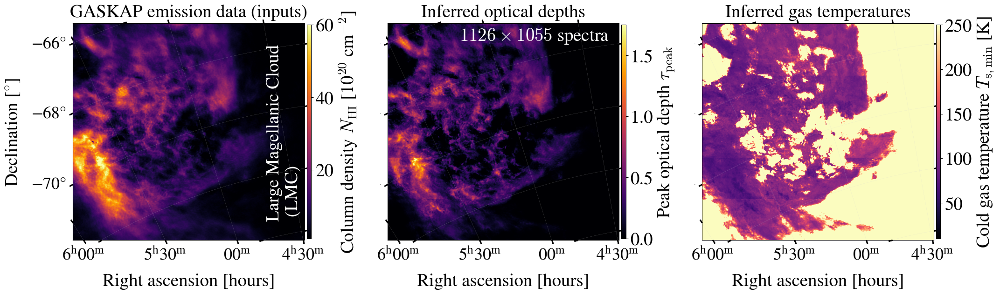

In [ ]:
xlbs = 28
tlbs = 26
cmap = 'viridis'

fig = plt.figure(figsize=(24,9))


ax = fig.add_subplot(131, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(nhi_lmc, cmap='inferno', origin='lower', vmin=1., vmax=60.)
ax.text(940, 110, "Large Magellanic Cloud \n (LMC)", fontsize=28, rotation=90, color='w')



# Title
ax.set_title(f'GASKAP emission data (inputs)', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel(r'Declination [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=50) # extend='max'
cbar.ax.set_ylabel(r'Column density $N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)







######
ax = fig.add_subplot(132, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(np.max(combined_tau_lmc, axis=0), cmap='inferno', origin='lower', vmin=0., vmax=1.75)

ax.text(350, 970, r"$1126 \times 1055$ spectra", fontsize=28, color='w')




# Title
ax.set_title(f'Inferred optical depths', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=50) # extend='max',
cbar.ax.set_ylabel(r'Peak optical depth $\tau_\mathrm{peak}$', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)




######
ax = fig.add_subplot(133, projection=wcs2D_lmc)

# Display the moment map image
# im = ax.imshow(np.sum(small_cube_back, axis=0)*0.018224*np.diff(new_vel)[0], cmap='inferno', origin='lower', vmin=0.)
im = ax.imshow(np.min(combined_ts_lmc, axis=0), cmap='magma', origin='lower', vmin=10., vmax=250.)



# Title
ax.set_title(f'Inferred gas temperatures', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=50) # extend='max'
cbar.ax.set_ylabel(r'Cold gas temperature $T_\mathrm{s,min}$ [K]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)

# set the spacing between subplots
plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.32,
                    hspace=0.
                    )

plt.savefig(img_path / f'gaskap_inferred_lmc_maps.png', dpi=300, bbox_inches='tight')
plt.show()

# Inferred maps of optical depths and gas temperatures from GASKAP HI data: Milky Way and LMC

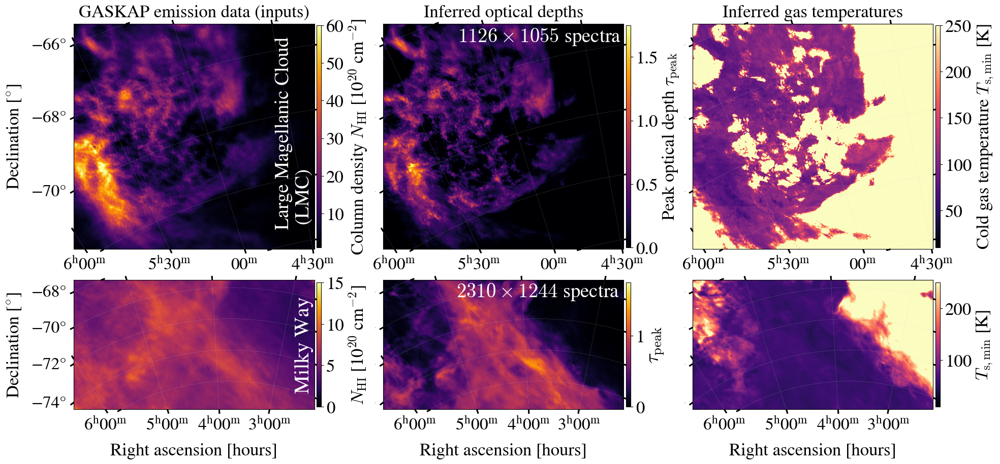

In [ ]:
xlbs = 25
tlbs = 24
cmap = 'viridis'

fig = plt.figure(figsize=(22,12))


ax = fig.add_subplot(234, projection=wcs2D)

# Display the moment map image
im = ax.imshow(nhi, cmap='inferno', origin='lower', vmin=0., vmax=15.)

ax.text(2120, 200, "Milky Way", fontsize=30, rotation=90, color='w')


# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel(r'Declination [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=28) # extend='max'
cbar.ax.set_ylabel(r'$N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)


######
ax = fig.add_subplot(235, projection=wcs2D)

# Display the moment map image
im = ax.imshow(tau_peak, cmap='inferno', origin='lower', vmin=0., vmax=1.75)
ax.text(700, 1080, r"$2310 \times 1244$ spectra", fontsize=28, color='w')

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=28) # extend='max',
cbar.ax.set_ylabel(r'$\tau_\mathrm{peak}$', rotation=90, labelpad=5., fontsize=xlbs+3)
cbar.ax.tick_params(labelsize=xlbs)


ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)




######
ax = fig.add_subplot(236, projection=wcs2D)

# Display the moment map image
im = ax.imshow(ts_min_map, cmap='magma', origin='lower', vmin=10., vmax=250.)

# Add axes labels
ax.set_xlabel(r'Right ascension [hours]', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=28) # extend='max'
cbar.ax.set_ylabel(r'$T_\mathrm{s,min}$ [K]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)







####
ax = fig.add_subplot(231, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(nhi_lmc, cmap='inferno', origin='lower', vmin=1., vmax=60.)

ax.text(940, 110, "Large Magellanic Cloud \n (LMC)", fontsize=28, rotation=90, color='w')



# Title
ax.set_title(f'GASKAP emission data (inputs)', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'', fontsize=xlbs)
ax.set_ylabel(r'Declination [$^{\circ}$]', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=50) # extend='max'
cbar.ax.set_ylabel(r'Column density $N_\mathrm{HI}$ [10$^{20}$ cm$^{-2}$]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)







######
ax = fig.add_subplot(232, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(np.max(combined_tau_lmc, axis=0), cmap='inferno', origin='lower', vmin=0., vmax=1.75)
ax.text(350, 970, r"$1126 \times 1055$ spectra", fontsize=28, color='w')


# Title
ax.set_title(f'Inferred optical depths', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=50) # extend='max',
cbar.ax.set_ylabel(r'Peak optical depth $\tau_\mathrm{peak}$', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)



ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)




######
ax = fig.add_subplot(233, projection=wcs2D_lmc)

# Display the moment map image
im = ax.imshow(np.min(combined_ts_lmc, axis=0), cmap='magma', origin='lower', vmin=10., vmax=250.)




# Title
ax.set_title(f'Inferred gas temperatures', pad=10, fontsize=xlbs)

# Add axes labels
ax.set_xlabel(r'', fontsize=xlbs)
ax.set_ylabel('', fontsize=xlbs)

# Color bar
cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.018, pad=0.01, aspect=50) # extend='max'
cbar.ax.set_ylabel(r'Cold gas temperature $T_\mathrm{s,min}$ [K]', rotation=90, labelpad=5., fontsize=xlbs)
cbar.ax.tick_params(labelsize=xlbs)

ax.minorticks_on()
ax.tick_params(axis='x', labelsize=tlbs, pad=4)
ax.tick_params(axis='y', labelsize=tlbs)
ax.tick_params(axis='y', labelsize=0)
ax.set_ylabel('')
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=4)

ax.grid(True, linestyle='--', linewidth=0.15, color='lightgray', zorder=-10)

# set the spacing between subplots
plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.25,
                    hspace=-0.2
                    )

plt.savefig(img_path / f'gaskap_inferred_mw_fg_lmc_maps.png', dpi=300, bbox_inches='tight')
plt.show()

# End